In [3]:
from astroquery.sdss import SDSS
import astropy.units as u
from astropy.io import fits
import matplotlib.pyplot as plt
import math
import numpy as np
from specutils import Spectrum
from specutils.fitting import fit_generic_continuum
from specutils.manipulation import LinearInterpolatedResampler
from labellines import labelLines
import matplotlib.axes as axes
from scipy.optimize import curve_fit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
import scipy
from PIL import Image
from fpdf import FPDF
import random

In [4]:
eboss_fits = fits.open('eboss_dr17_summary_edapv10_cigale.fit', memmap=True)

eboss_data = eboss_fits[1].data
eboss_fits.info()
print(eboss_fits[1].columns)

Filename: eboss_dr17_summary_edapv10_cigale.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    235   1898753R x 109C   ['J', 'J', 'J', '16A', 'D', 'E', 'D', 'D', 'E', '118A', '4A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '9A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '8E', '8E', '8E', '8E', '5E', '5E', '5E', '5E', 'E', 'E', 'A', 'A', 'A', 'I', 'I', 'I']   
ColDefs(
    name = 'PLATE'; format = 'J'
    name = 'MJD'; format = 'J'
    name = 'FIBER'; format = 'J'
    name = 'PMF_STRING'; format = '16A'
    name = 'Z'; format = 'D'
    name = 'Z_ERR'; format = 'E'
    nam

In [5]:
# Remove possible +/- inf values
gals_flux = eboss_data[(eboss_data['NII_6584_FLUX_ERR']>0)]

err_range = 3

# Make sure relavent emission lines have well measured fluxes
quality_gals = gals_flux[((gals_flux['H_ALPHA_FLUX']/gals_flux['H_ALPHA_FLUX_ERR'])>err_range) &
                (((gals_flux['NII_6584_FLUX']/gals_flux['NII_6584_FLUX_ERR'])>err_range) | (gals_flux["H_GAMMA_EW"]>10)) & 
                (gals_flux['Z']<0.15)] #signal to noise ratio filter

cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]

print(len(cut_gals))

gals_sf = cut_gals[cut_gals['SFG']==1]
gals_agn = cut_gals[cut_gals['AGN']==1]

1286


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\3052148939.py:11: RuntimeWarning: divide by zero encountered in log10
  cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]


In [8]:
random_galaxies = random.sample(range(1, len(cut_gals)), 100)
random_galaxies.sort()
print(random_galaxies)
random_galaxies = [4, 8, 15, 18, 23, 32, 34, 51, 55, 62, 70, 71, 72, 91, 95, 100, 115, 121, 127, 137, 153, 158, 168, 175, 183, 219, 220, 224, 230, 234, 241, 257, 265, 271, 274, 277, 283, 287, 313, 336, 342, 384, 430, 442, 500, 502, 505, 511, 521, 533, 534, 550, 565, 566, 567, 568, 571, 611, 618, 656, 662, 667, 673, 710, 711, 750, 764, 772, 791, 796, 808, 819, 824, 837, 838, 843, 852, 854, 861, 862, 869, 875, 876, 913, 919, 922, 924, 970, 976, 987, 990, 1037, 1104, 1177, 1201, 1207, 1221, 1226, 1234, 1258]

[18, 34, 47, 88, 105, 122, 135, 137, 138, 153, 171, 205, 206, 230, 233, 237, 247, 251, 259, 261, 267, 298, 314, 343, 351, 382, 388, 390, 416, 419, 422, 430, 457, 461, 474, 478, 485, 519, 527, 528, 529, 535, 599, 610, 613, 628, 658, 659, 661, 667, 691, 705, 707, 712, 717, 731, 741, 745, 755, 757, 784, 804, 813, 848, 852, 860, 871, 927, 961, 967, 977, 979, 980, 989, 996, 1003, 1007, 1013, 1023, 1025, 1040, 1082, 1094, 1102, 1119, 1129, 1172, 1181, 1182, 1187, 1190, 1197, 1216, 1218, 1232, 1242, 1248, 1254, 1256, 1277]


In [94]:
c = 3*10**5 #km/s
inf = math.inf

def o_iii_1(x, amp, sig, v):
    x_0 = 5008.240* (1+(v/c))
    wid= sig*x_0/c
    return (3*amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))
    
def o_iii_2(x, amp, sig, v):
    x_0 = 4960.295 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def broad_1(x, amp, sig, v):
    x_0 = 5008.240* (1+(v/c))
    wid= sig*x_0/c
    return (3*amp * np.exp(-(x - x_0)**2 / (2 * (wid)**2)))

def broad_2(x, amp, sig, v):
    x_0 = 4960.295 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * (wid)**2)))

def Gauss(x,B,amp1, amp2, sig1, sig2, v_n, v_b):
    return B+o_iii_1(x, amp1, sig1, v_n) + o_iii_2(x, amp1, sig1, v_n) + broad_1(x, amp2, sig2, v_b) + broad_2(x, amp2, sig2, v_b)

0
3615-56544-100


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


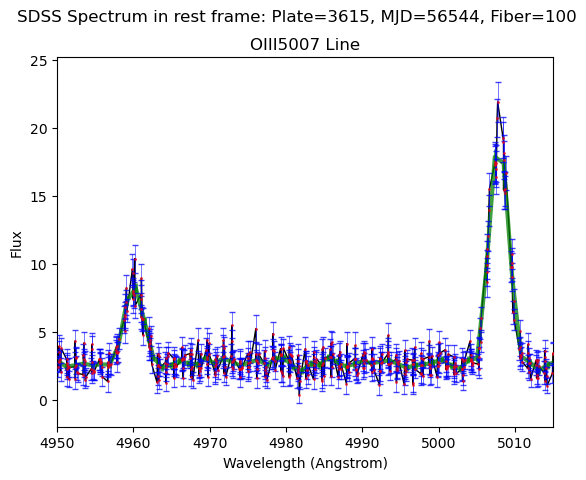

11559 12041
[2.57303911e+00 5.46379146e+00 1.05128088e+00 7.22275308e+01
 1.84142587e+03 2.93046499e-01 7.22864508e+05]


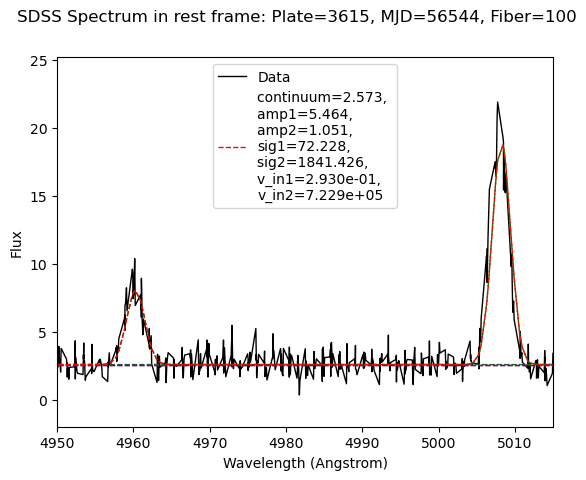

1
3657-55244-4


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


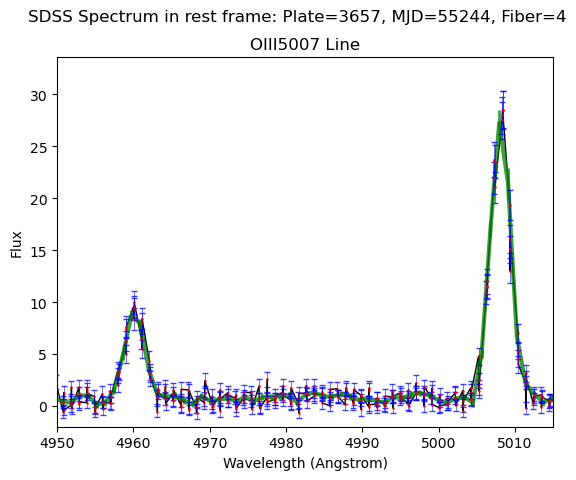

6685 6937
[6.40563279e-01 8.87432822e+00 1.19213459e+00 7.44481576e+01
 8.82970767e+02 4.89105723e-05 1.62373042e+04]


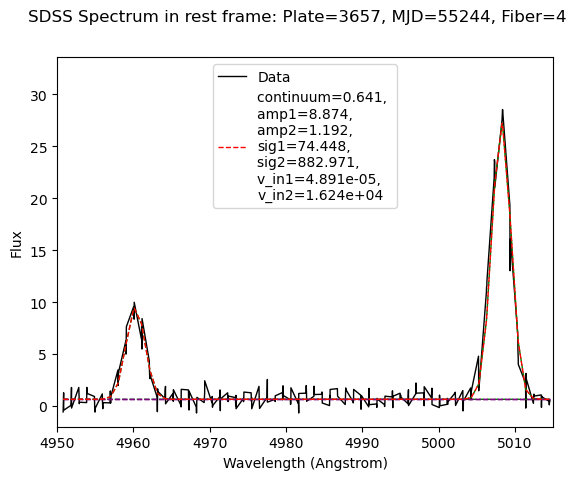

2
3670-55480-196


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


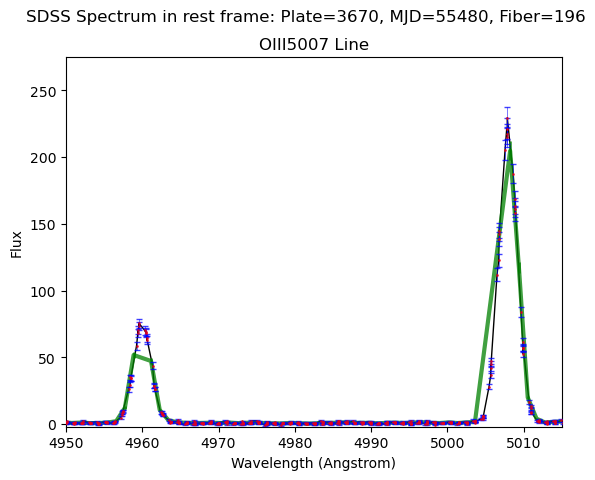

8026 8336
[7.13150934e-01 6.88062025e+01 2.49281229e-01 7.02962332e+01
 5.00000000e+02 2.39202748e-16 1.41387634e-08]


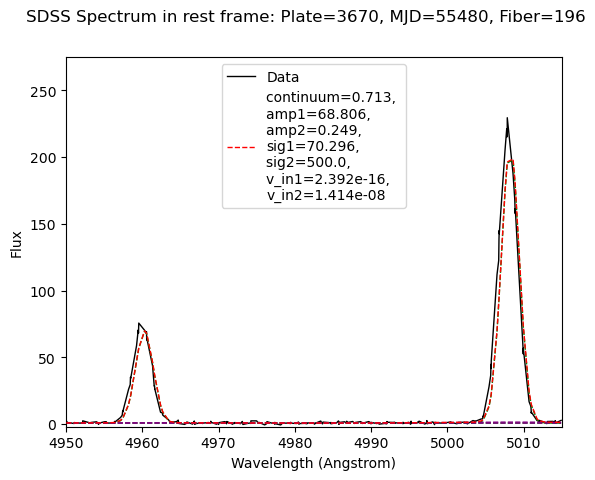

3
3691-55274-169


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


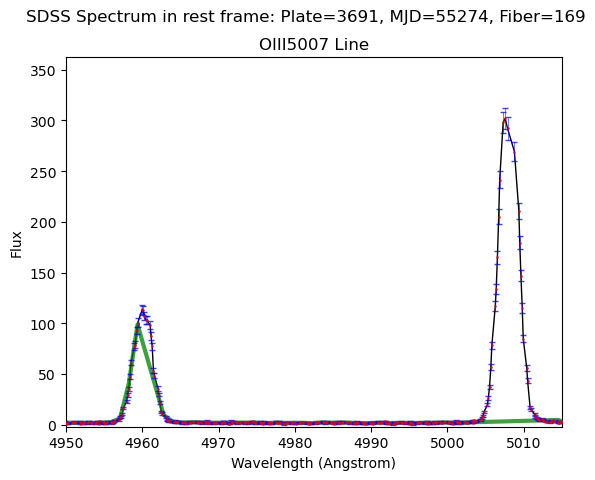

8438 8747
[1.77278365e+00 1.10202340e+02 3.88826922e-01 7.01848895e+01
 5.00000000e+02 2.70238168e-15 5.37262983e+01]


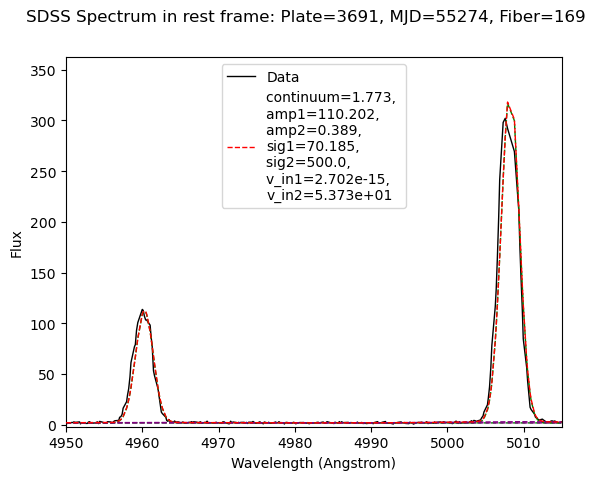

4
3744-55209-368


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


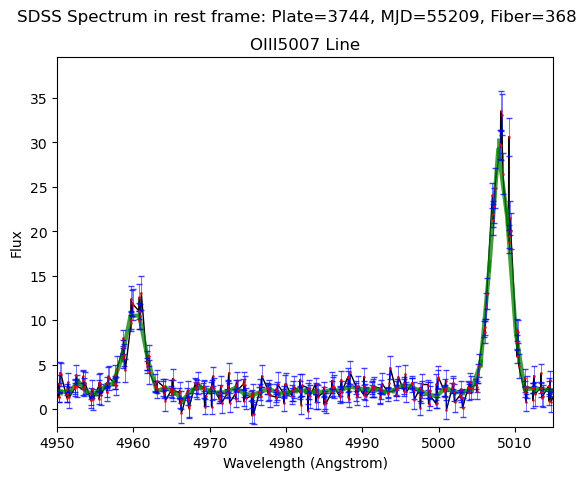

7818 8128
[1.96906719e+00 9.58012542e+00 5.42184555e-02 7.14537600e+01
 1.14414318e+03 2.71108199e-06 7.15655839e+04]


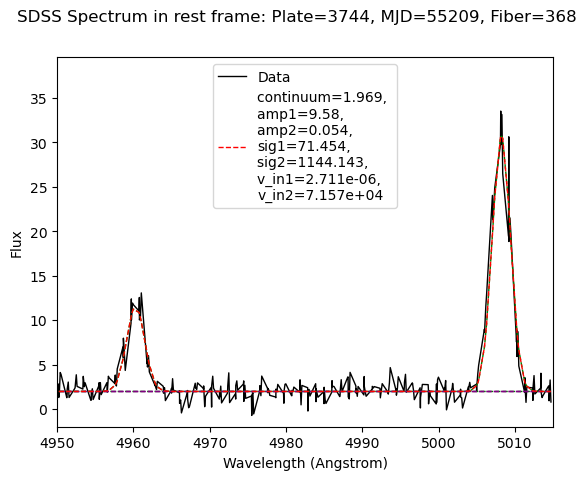

5
3771-55544-642


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


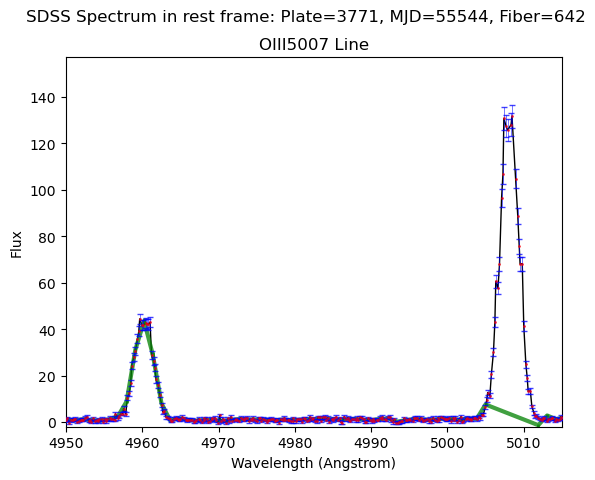

7573 7878
[8.13129686e-01 4.47193087e+01 1.22651960e-01 7.10454738e+01
 9.30089732e+02 4.49070990e-37 1.22588664e-09]


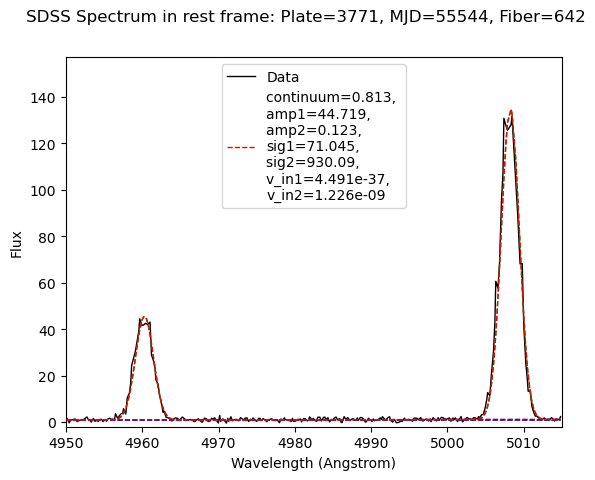

6
3772-55277-36


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


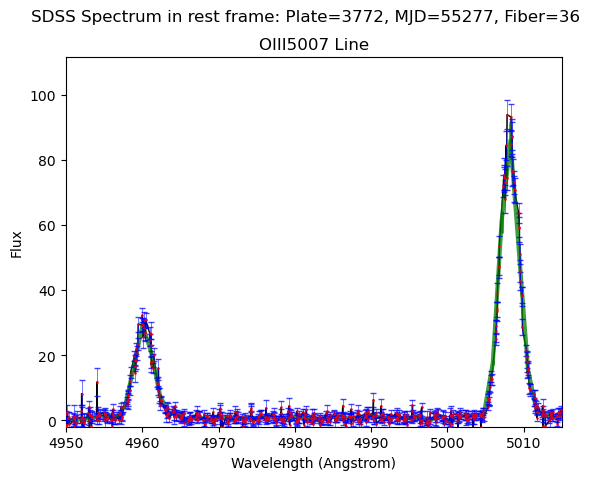

16060 16643
[6.85136869e-01 2.84421544e+01 5.79480506e-01 7.39853269e+01
 5.00000000e+02 7.61769286e-23 3.65260772e+03]


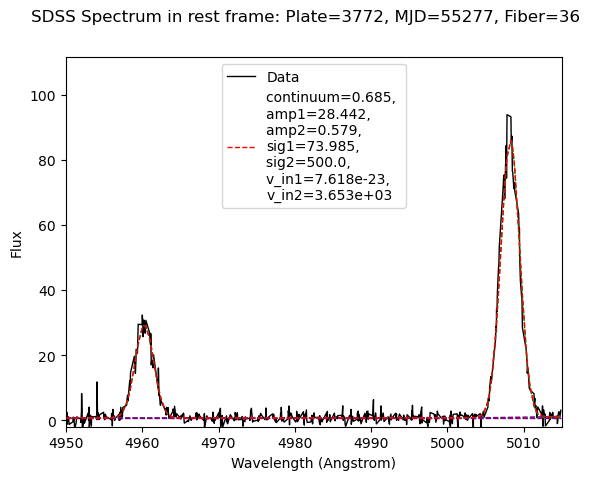

7
3837-55572-639


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


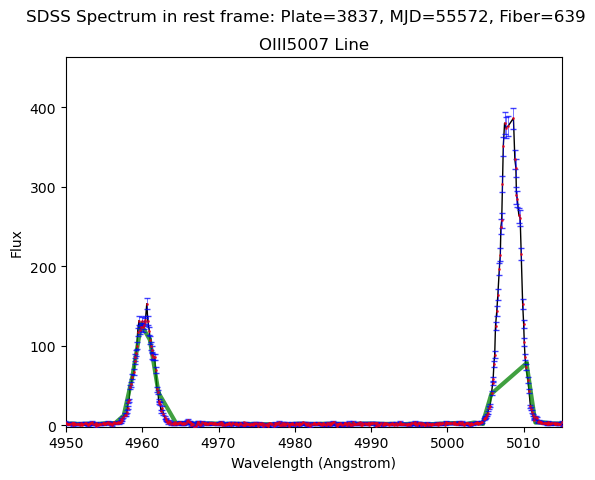

13847 14349
[1.46483004e+00 1.39324176e+02 2.46763438e-01 6.77127385e+01
 5.00000000e+02 1.66141834e-10 4.13117595e+01]


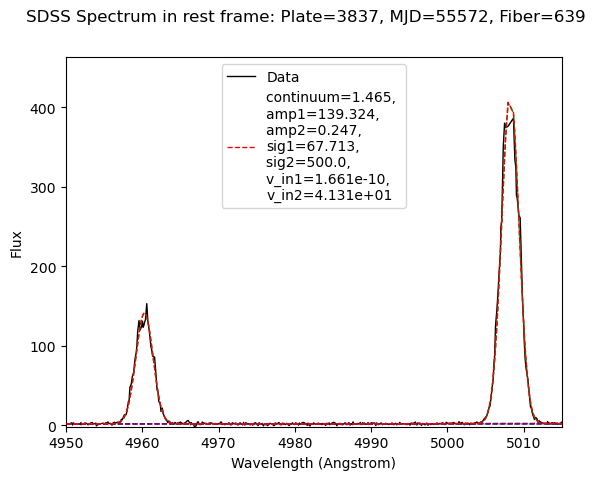

8
3854-55247-366


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


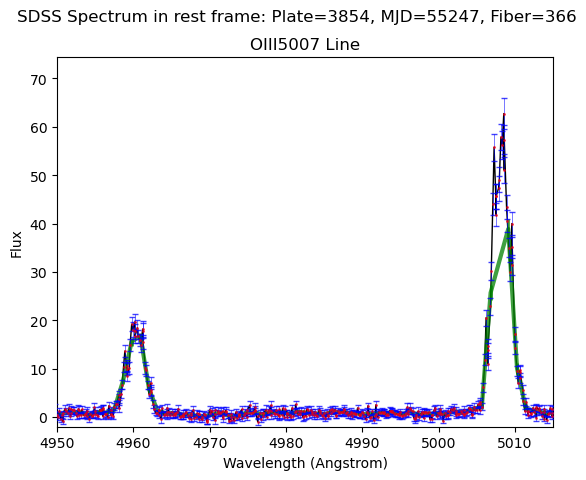

10949 11383
[5.85377342e-01 1.82778618e+01 2.25791383e-01 6.76949347e+01
 1.22399044e+03 1.80911504e+00 3.33585210e+03]


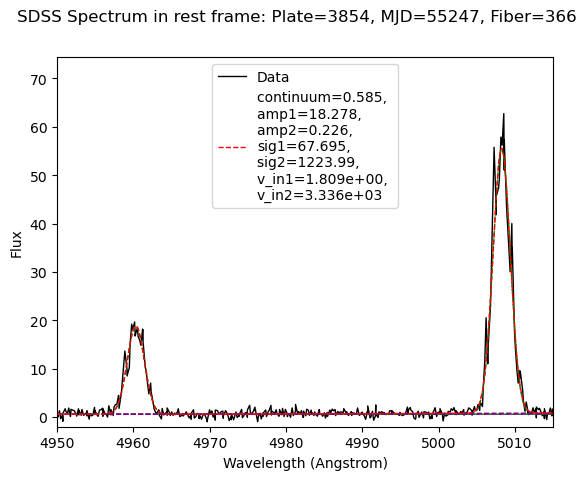

9
3874-55280-437


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


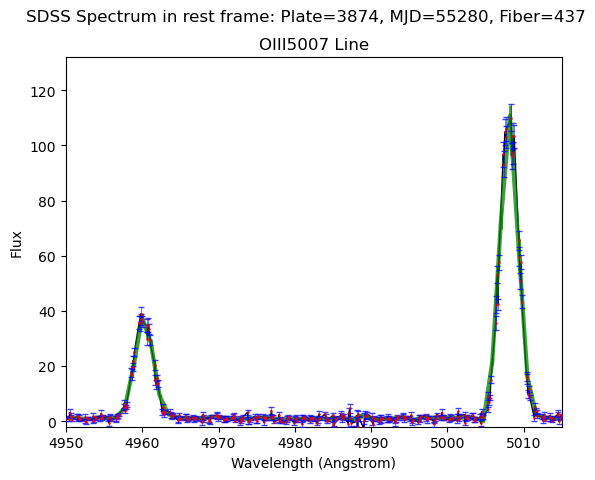

8714 9034
[1.02501946e+00 3.71429582e+01 1.15687419e-02 6.94859926e+01
 1.46337076e+03 1.22773145e-09 3.82307188e+04]


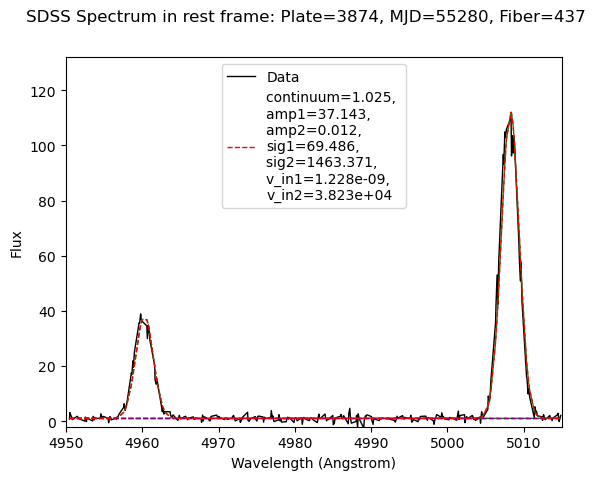

10
3951-55681-136


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


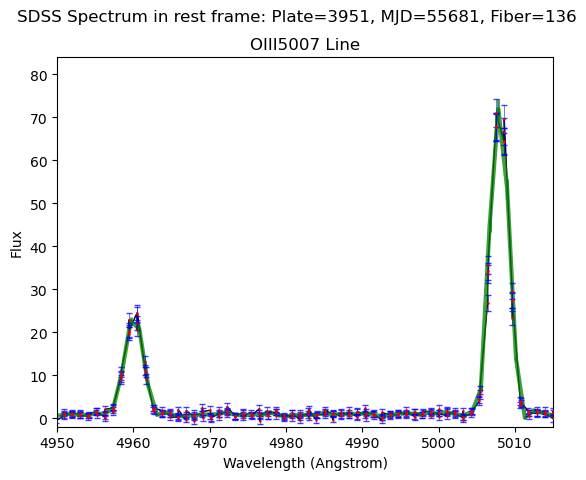

6088 6330
[8.47718605e-01 2.41601118e+01 1.56051928e-01 6.60583790e+01
 7.73024067e+02 1.14518933e-05 1.22969525e+05]


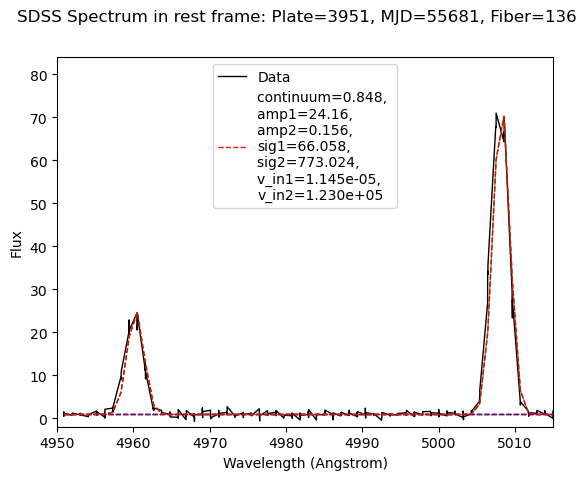

11
3954-55680-189


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


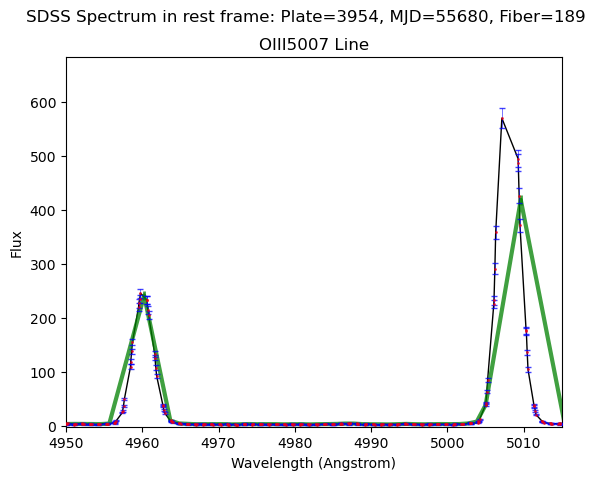

6304 6545
[2.69667675e+00 2.34236483e+02 2.69400867e-01 7.76277670e+01
 5.00000000e+02 2.30153188e-19 4.21953686e+01]


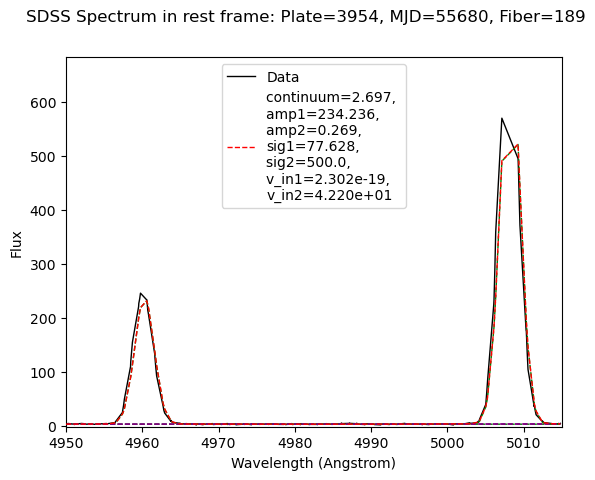

12
3954-55680-268


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


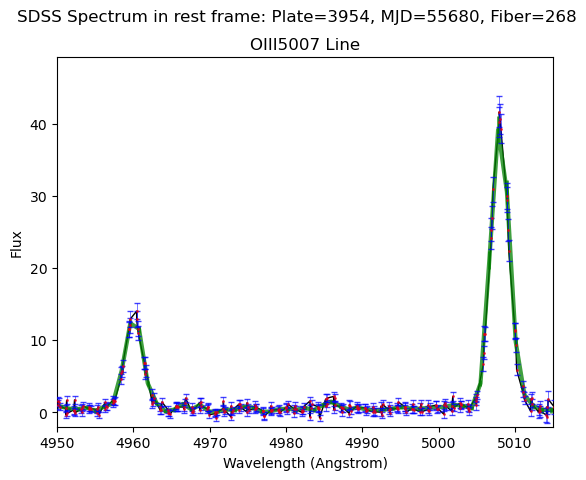

6817 7069
[4.97821385e-01 1.25803242e+01 1.15374982e+00 7.16096786e+01
 8.53086299e+02 5.41858090e-05 2.34558557e+04]


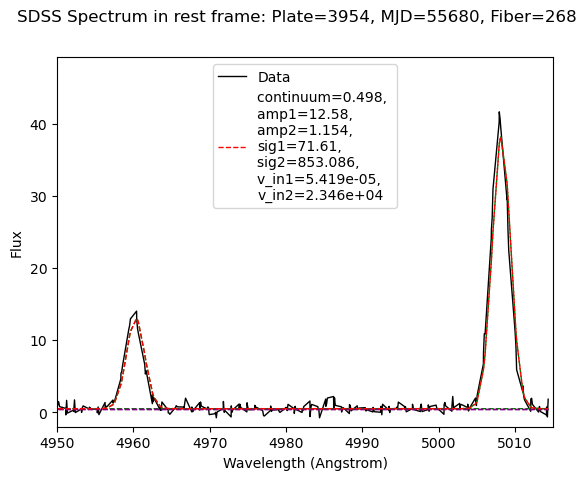

13
4092-55477-446


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


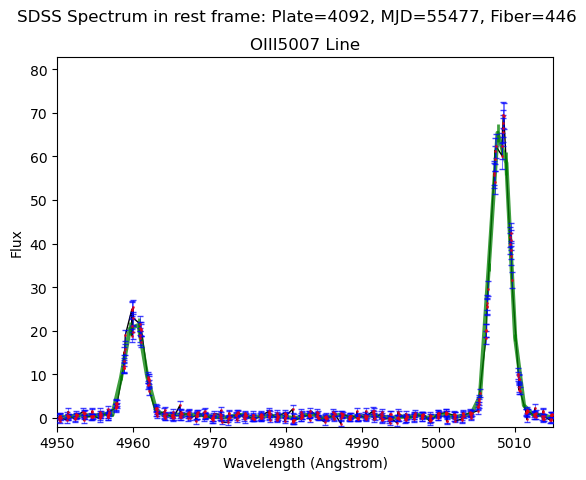

10918 11351
[3.67089900e-01 2.33391959e+01 8.11265337e-02 7.06126096e+01
 6.56055569e+02 2.88074274e-03 7.16694943e+05]


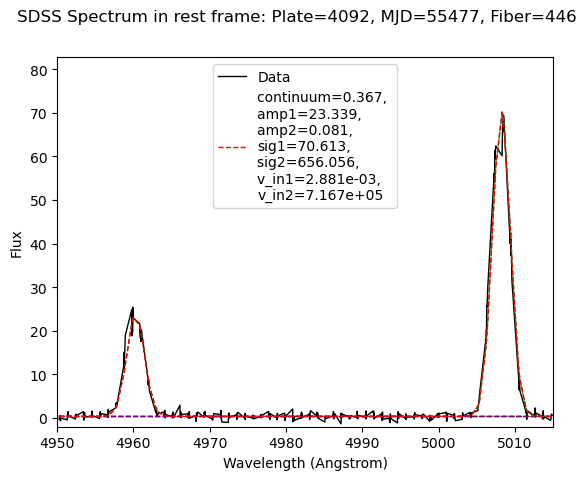

14
4174-55659-410


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


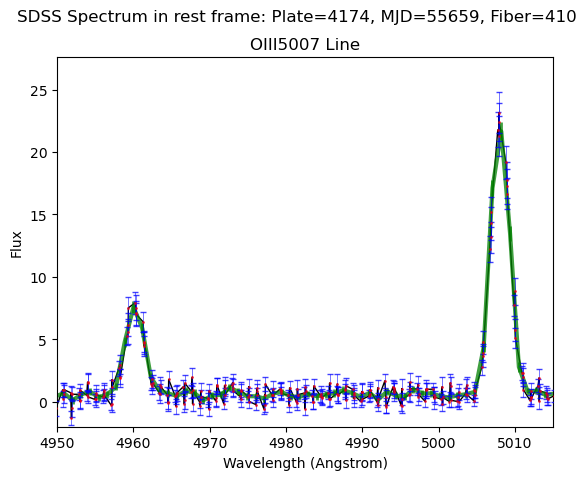

6307 6551
[5.03522482e-01 7.29099208e+00 1.17048481e+00 7.16820314e+01
 8.66899315e+02 5.12175517e-02 1.41532589e+05]


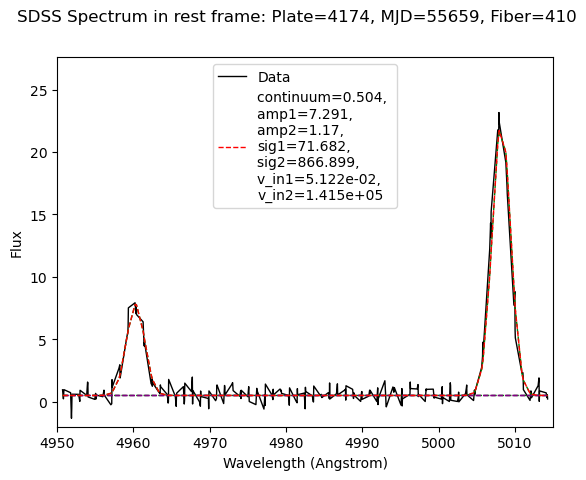

15
4182-55446-204


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


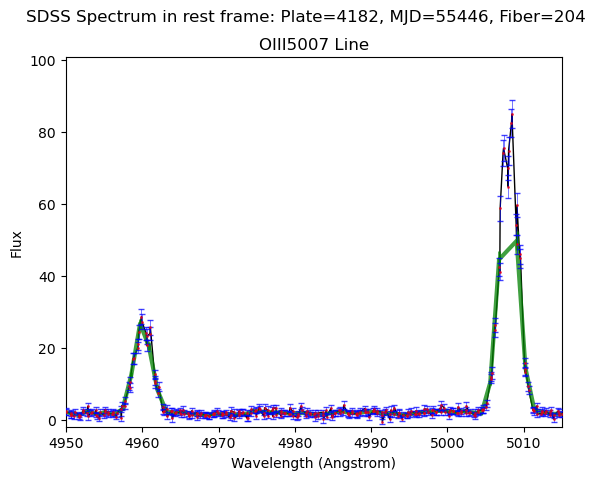

6704 6998
[1.71812325e+00 2.51586970e+01 3.14697660e-01 6.86743674e+01
 5.05830189e+02 2.69748322e-03 3.45482748e+05]


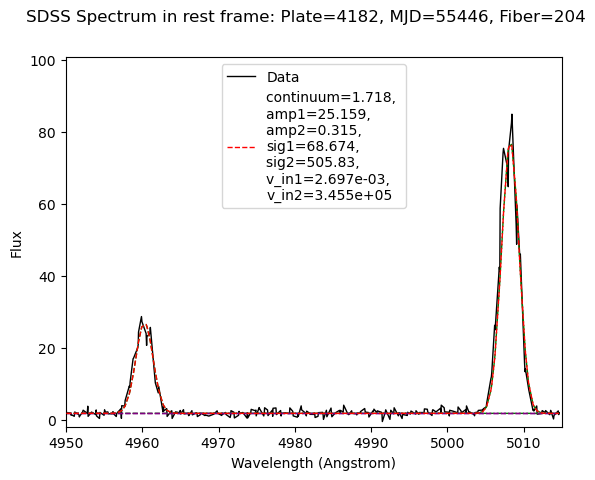

16
4228-55484-840


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


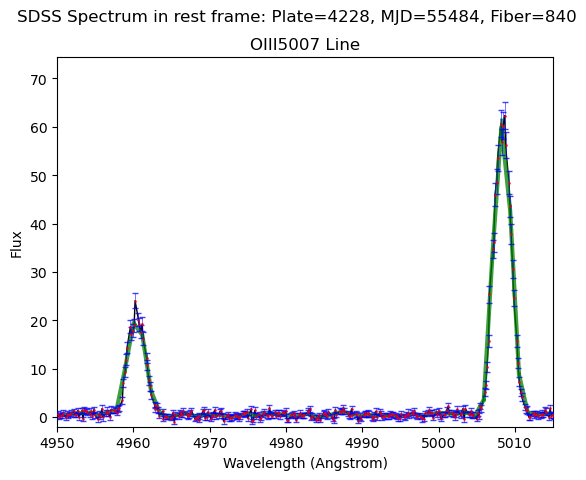

7710 8019
[3.96700357e-01 2.11708154e+01 4.99999997e+00 6.45102274e+01
 5.00000000e+02 7.98769775e+00 4.66622367e+03]


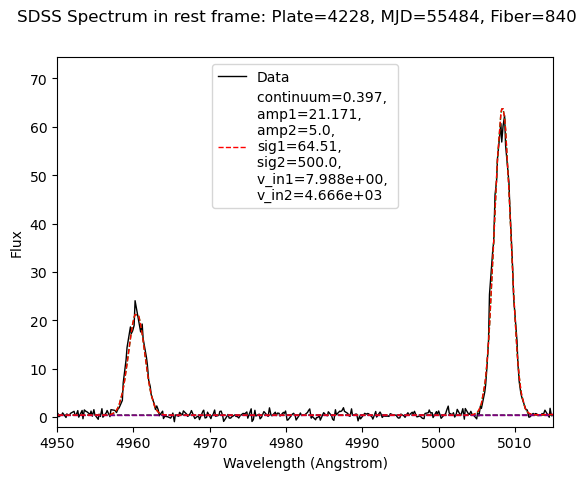

17
4256-55477-284


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


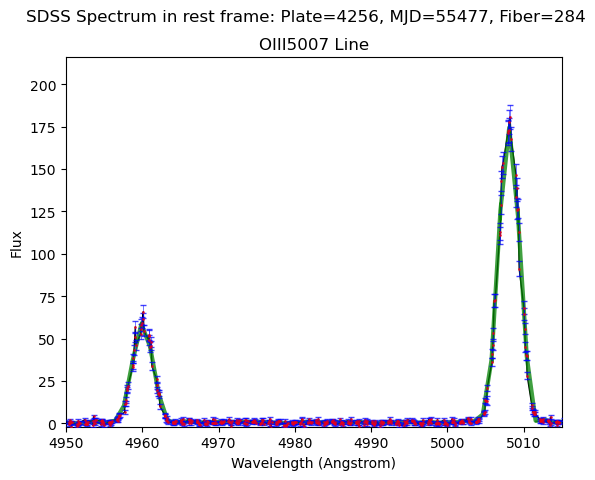

11377 11808
[4.02312393e-01 5.92181587e+01 3.29495564e-01 7.57079959e+01
 5.00000000e+02 7.57125548e-36 2.61893480e+03]


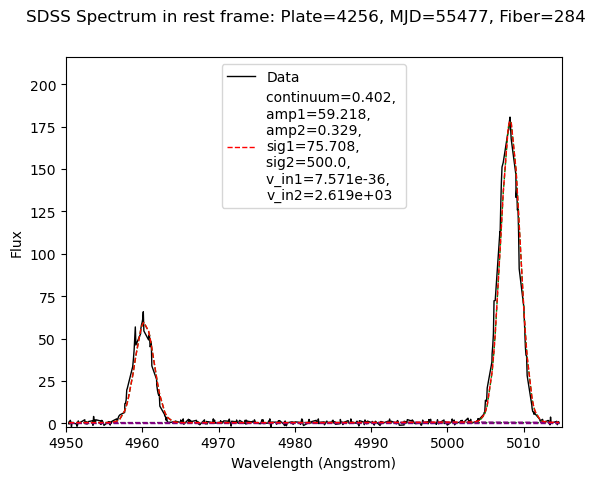

18
4269-55502-464


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


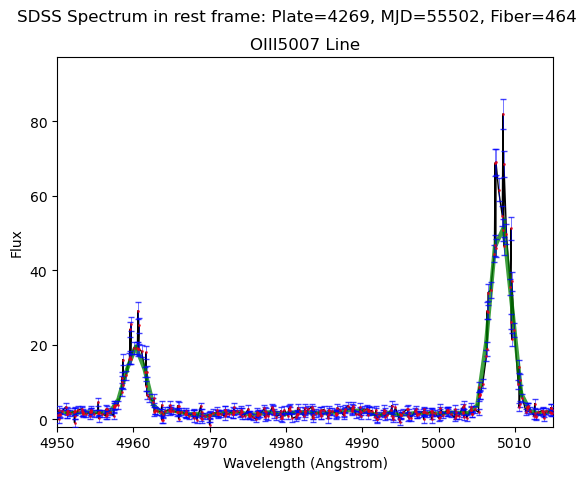

9827 10204
[1.62296498e+00 1.97883223e+01 1.10539852e-07 7.03119444e+01
 4.99960908e+03 5.37529747e-08 1.65509725e+05]


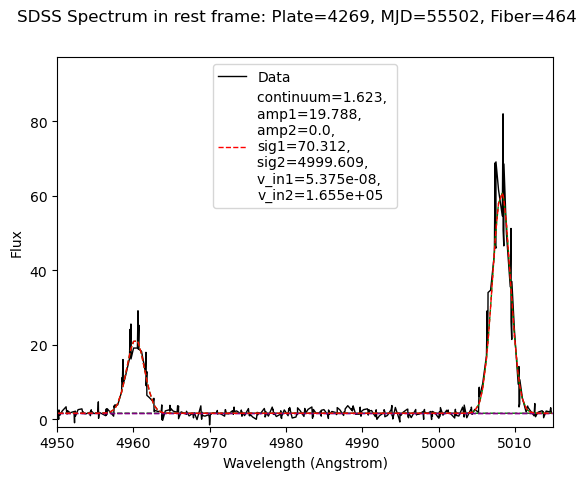

19
4297-55806-323


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


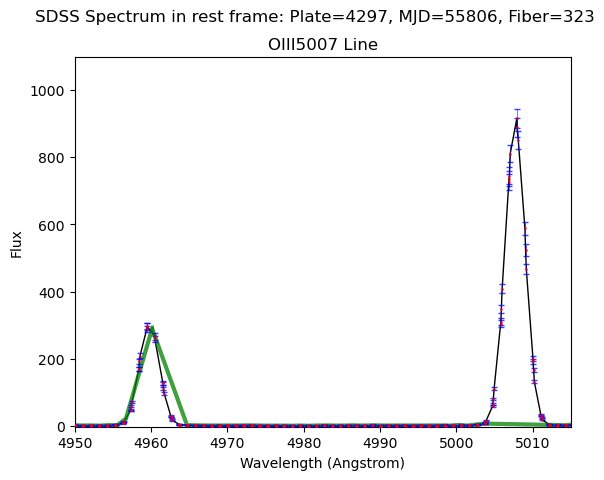

6373 6614
[1.39005731e+00 2.70720646e+02 7.96273914e-01 6.95860499e+01
 5.00000000e+02 4.87020565e-15 1.48806476e-06]


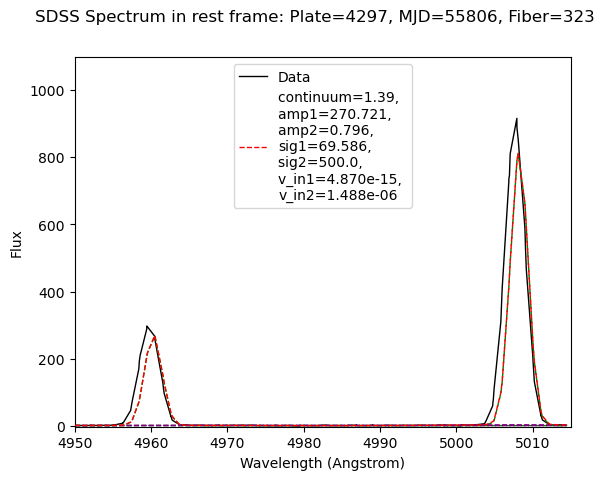

20
4382-55742-798


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


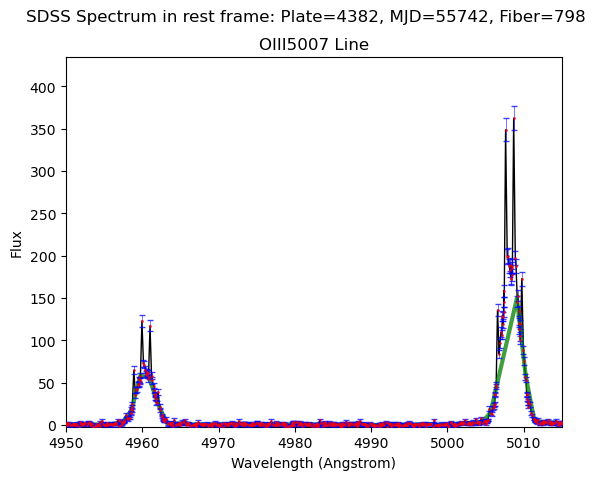

16700 17376
[  0.5353949   66.4259844    0.59244902  66.44118911 500.
   6.05558613 250.08748478]


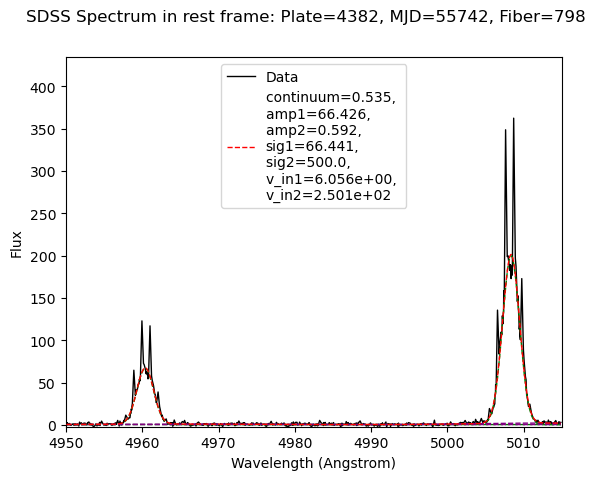

21
4391-55866-290


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


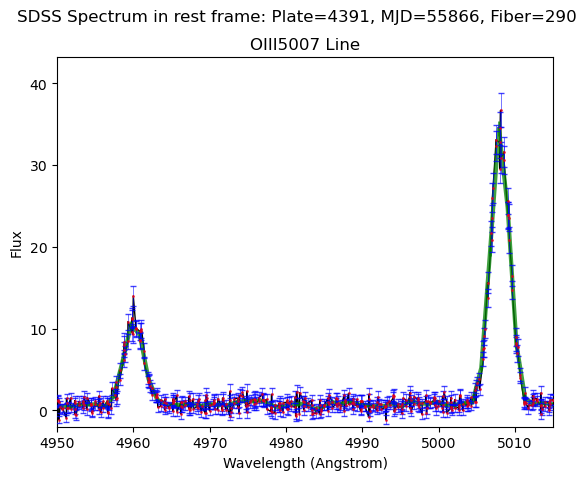

10570 10996
[6.40714369e-01 1.07867731e+01 1.18795124e+00 7.39368330e+01
 8.76163422e+02 3.25098829e-05 1.33278427e+04]


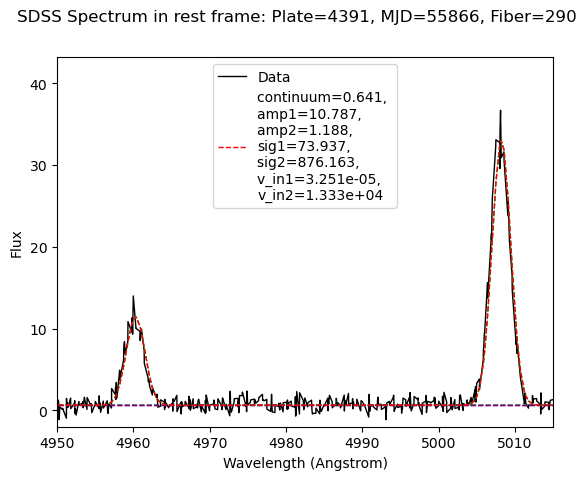

22
4412-55912-317


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


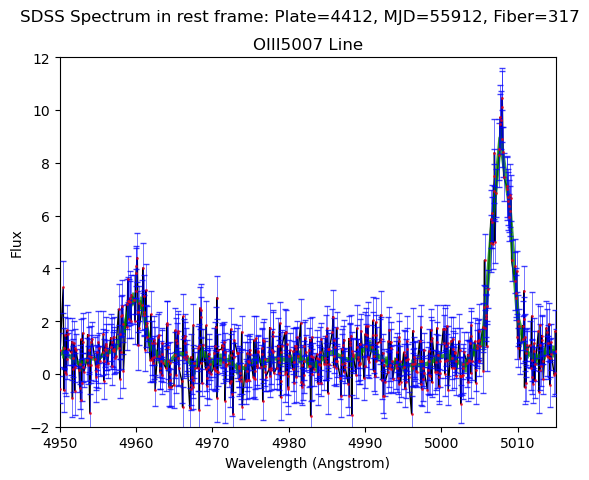

16807 17431
[5.02285904e-01 2.62378408e+00 1.08467677e+00 7.26116799e+01
 8.82434123e+02 9.02574154e-04 1.15834880e+04]


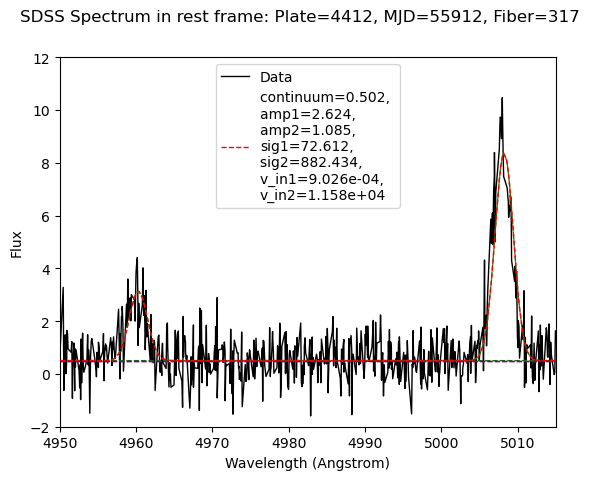

23
4445-55622-812


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


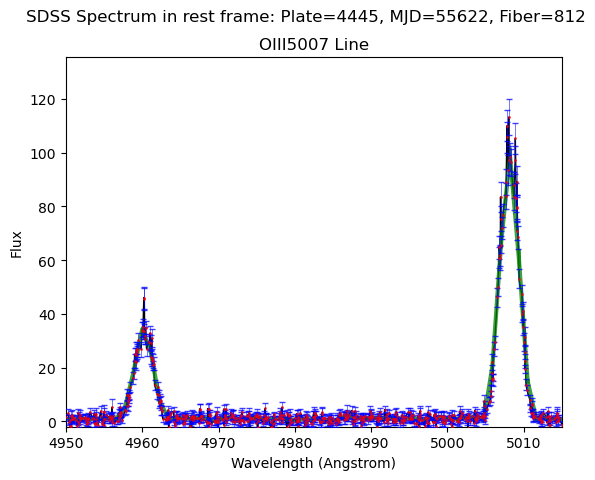

16706 17375
[8.29497613e-01 3.46893876e+01 1.99304556e-01 6.90396466e+01
 9.96265610e+02 4.04246042e-04 7.14623692e+05]


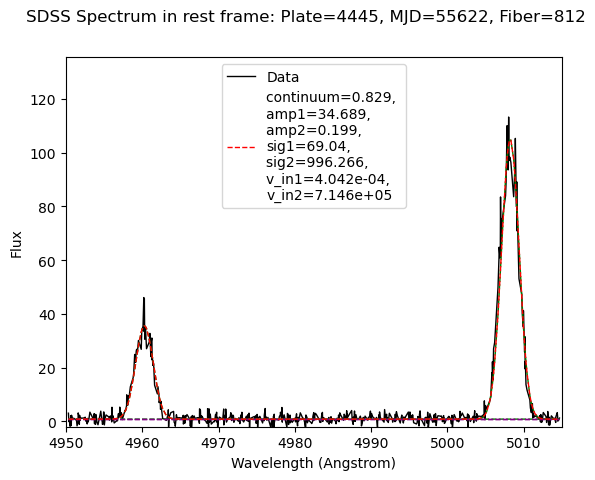

24
4456-55537-872


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


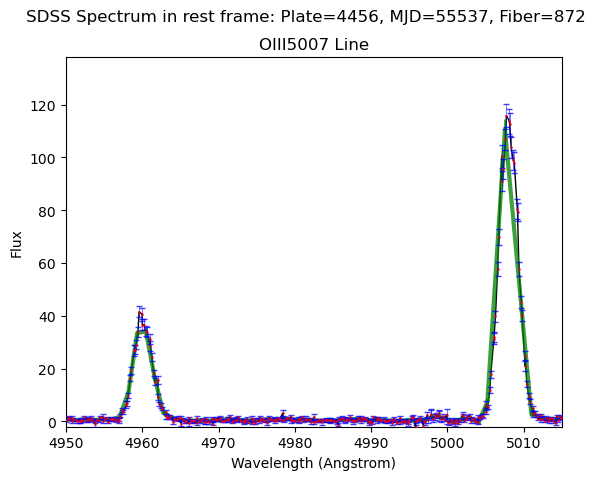

8506 8823
[5.30787959e-01 3.75363445e+01 2.13351884e-01 7.02205974e+01
 5.00000000e+02 1.65539411e-25 2.73550341e+03]


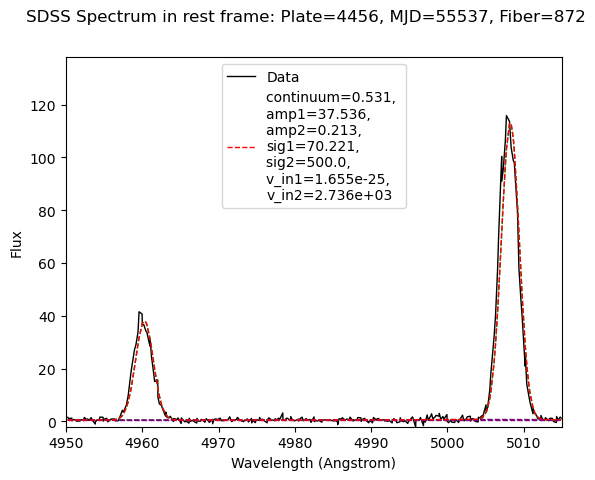

25
4612-55590-111


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


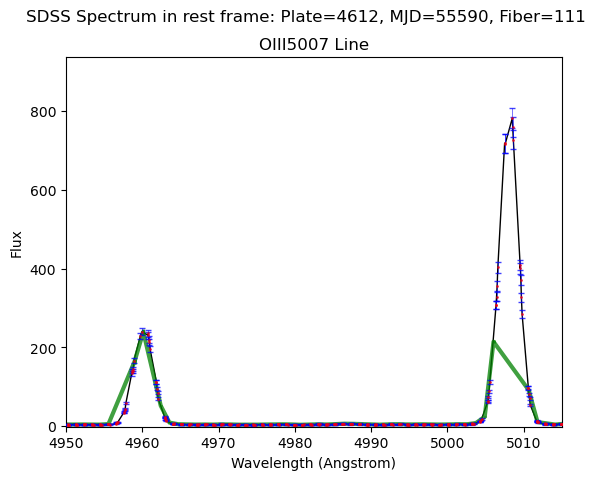

7819 8120
[3.39826519e+00 2.56659646e+02 3.22312262e-01 7.20361569e+01
 9.78227953e+02 3.17032986e-11 1.99186235e-07]


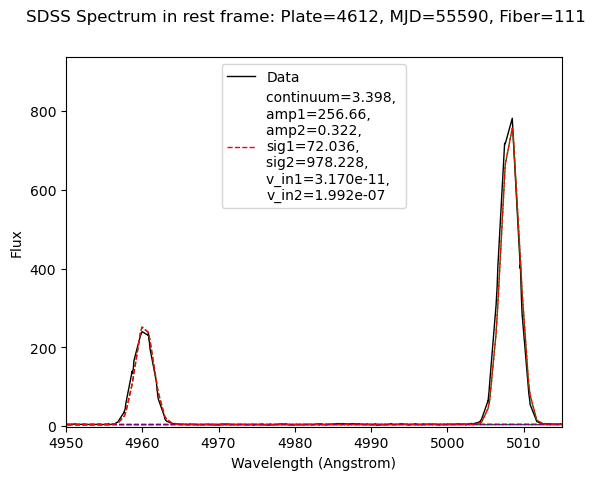

26
4614-55604-502


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


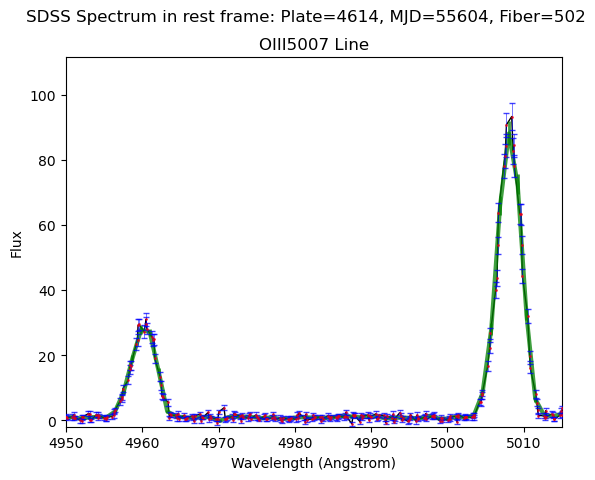

6249 6496
[7.85238754e-01 3.00101929e+01 5.84384930e-01 8.94952665e+01
 6.95034759e+02 3.65824860e-06 5.49497183e+04]


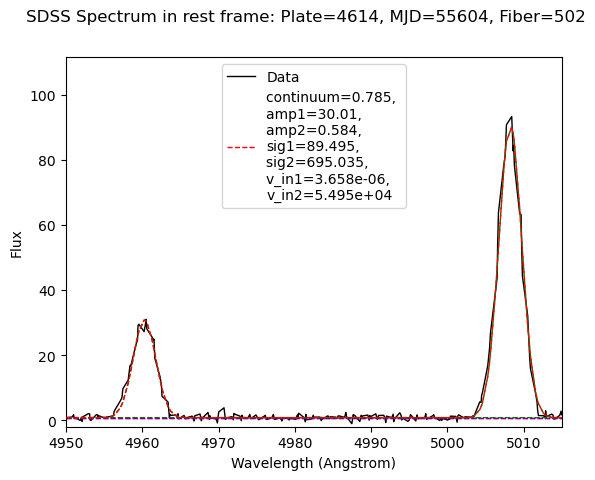

27
4622-55629-262


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


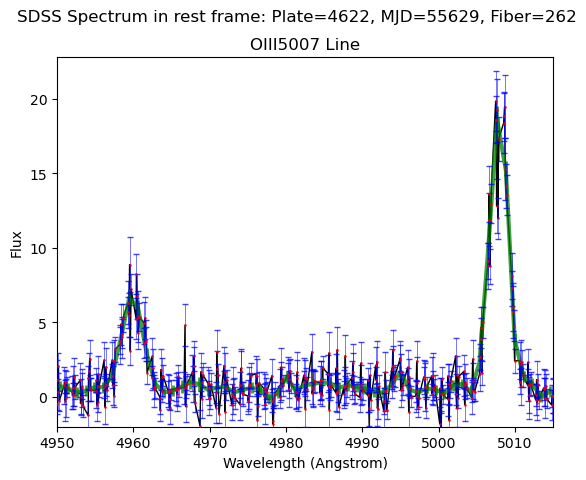

9837 10206
[5.47327558e-01 5.58387233e+00 6.94390180e-01 7.30297456e+01
 7.36780056e+02 7.08824469e-01 7.14876785e+05]


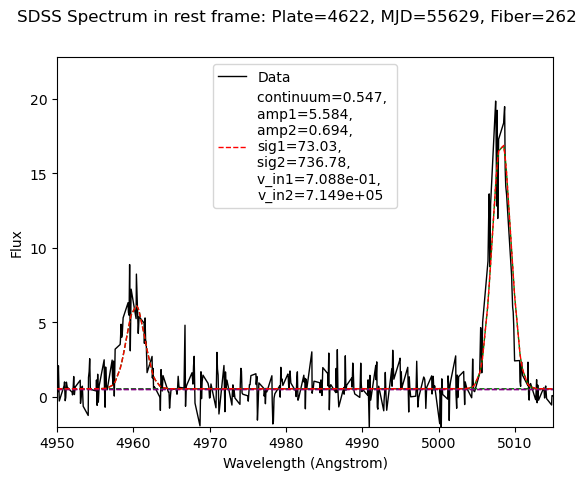

28
4638-55956-131


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


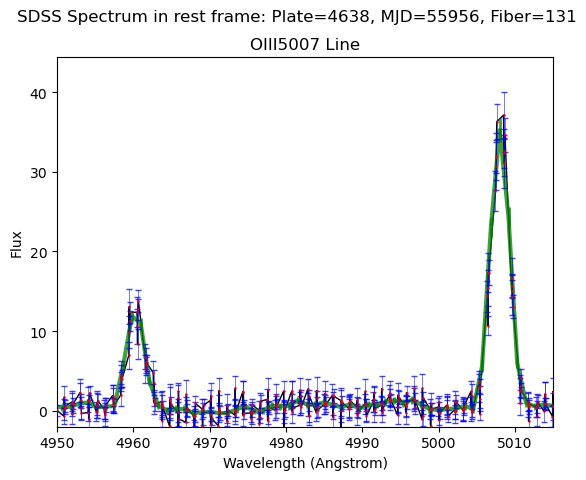

7633 7935
[4.06436972e-01 1.21951403e+01 1.16772217e+00 6.77923830e+01
 8.73952735e+02 1.28554248e-03 1.15822519e+05]


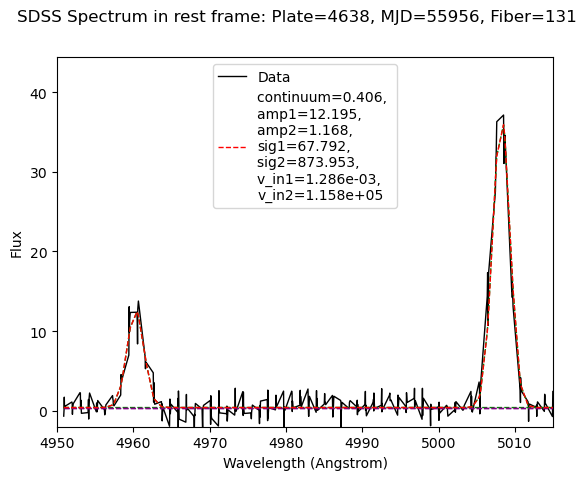

29
4653-55622-332


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


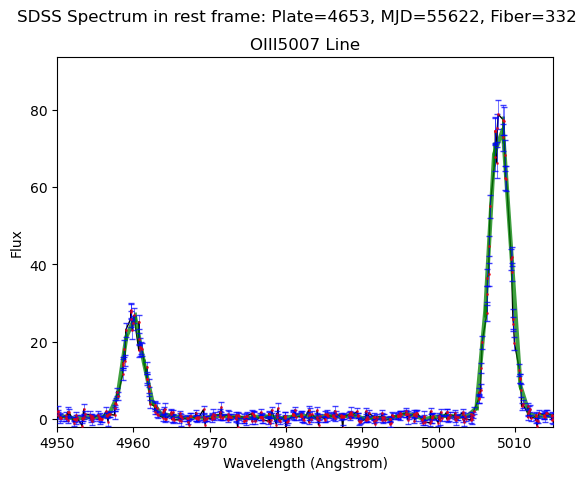

9367 9736
[4.16621086e-01 2.56092369e+01 8.61101151e-02 7.33351053e+01
 5.00000000e+02 1.14303789e-37 2.40354022e+03]


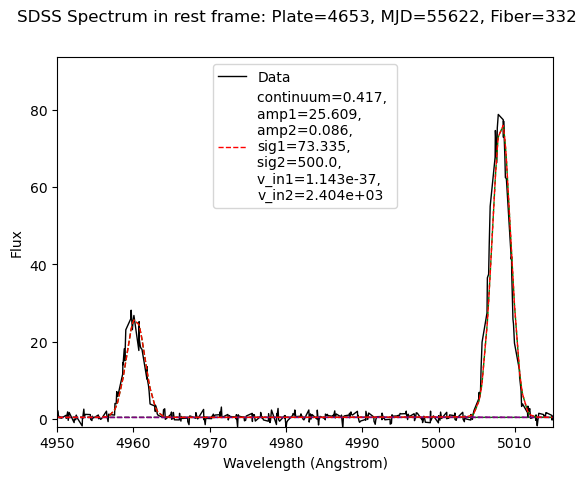

30
4699-55684-531


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


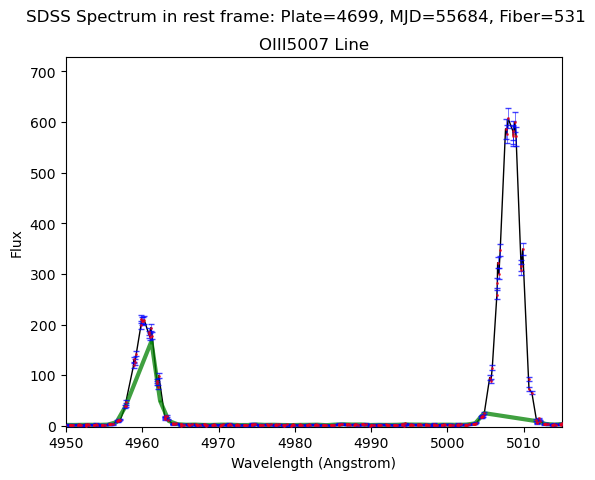

8107 8408
[1.63561109e+00 2.11778970e+02 3.05424008e-01 7.53295697e+01
 5.00000000e+02 3.46446901e-14 9.53257193e-13]


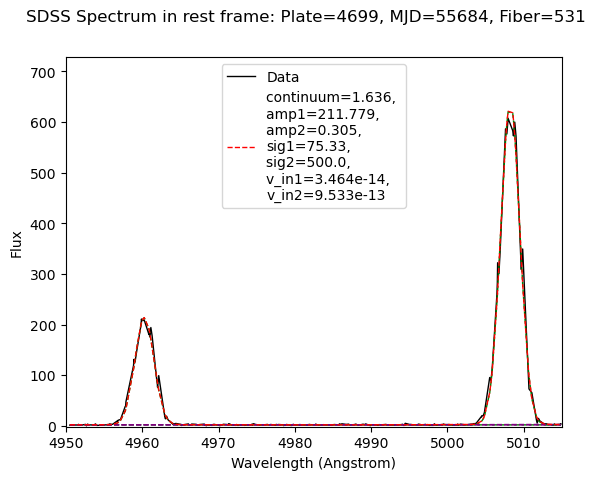

31
4752-55653-166


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


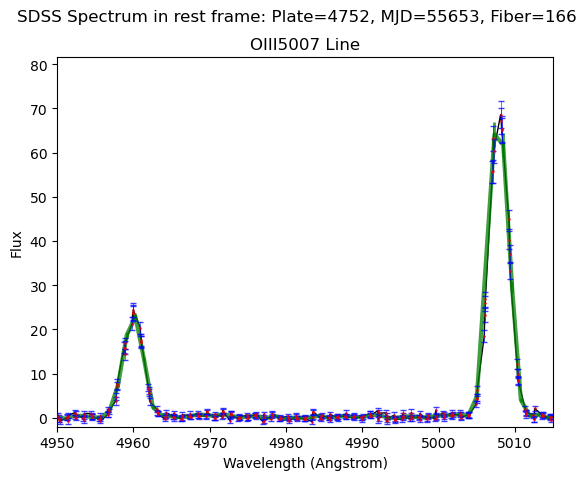

5987 6231
[2.78875996e-01 2.23484492e+01 1.78709209e-01 7.24048957e+01
 1.37196386e+03 1.19064886e-09 1.66039360e+05]


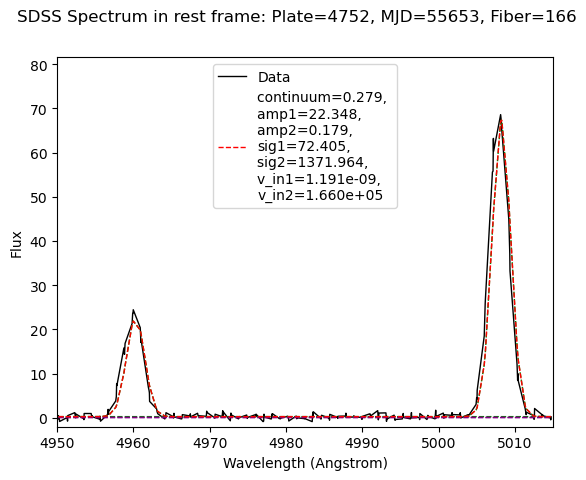

32
4772-55654-849


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


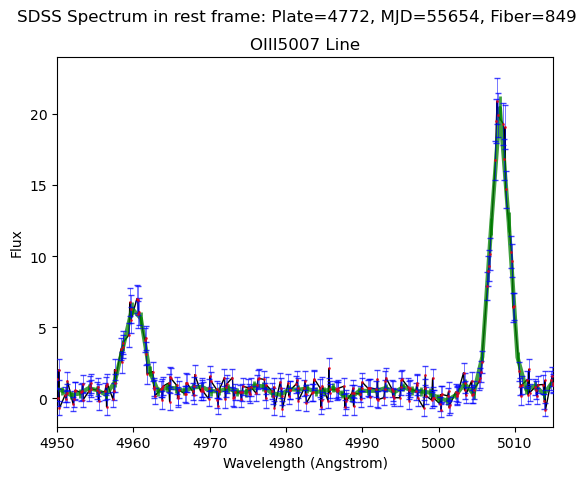

6377 6628
[4.45632055e-01 6.60171265e+00 1.16739193e+00 6.73733761e+01
 8.60271384e+02 3.42243026e-02 3.20375123e+05]


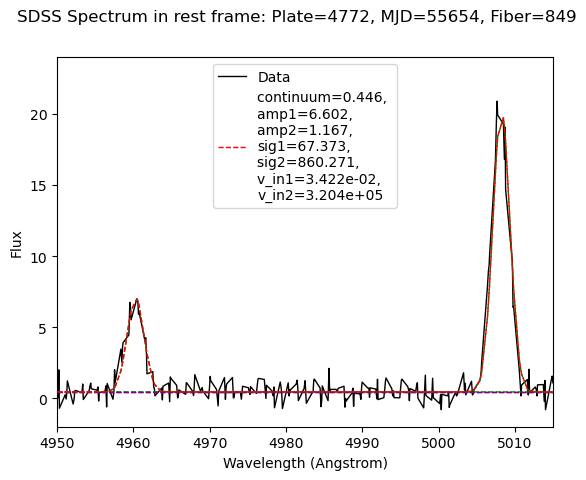

33
4806-55688-564


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


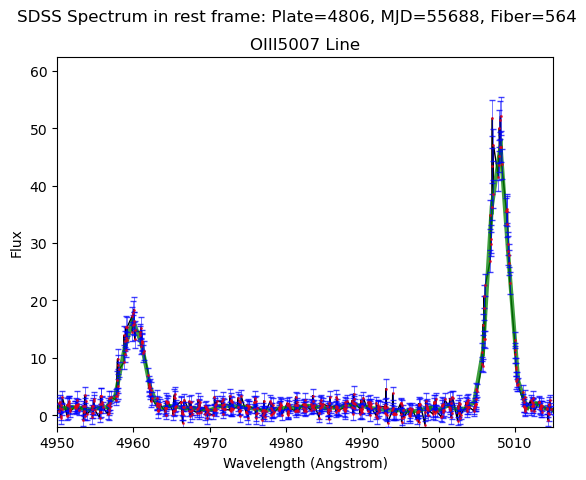

13226 13772
[1.19363338e+00 1.50534427e+01 1.16416142e+00 7.08257831e+01
 9.38130161e+02 6.68978726e-10 3.04120819e+04]


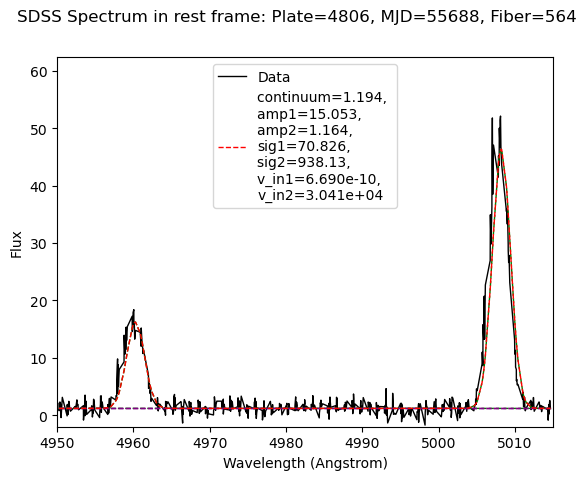

34
4839-55703-701


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


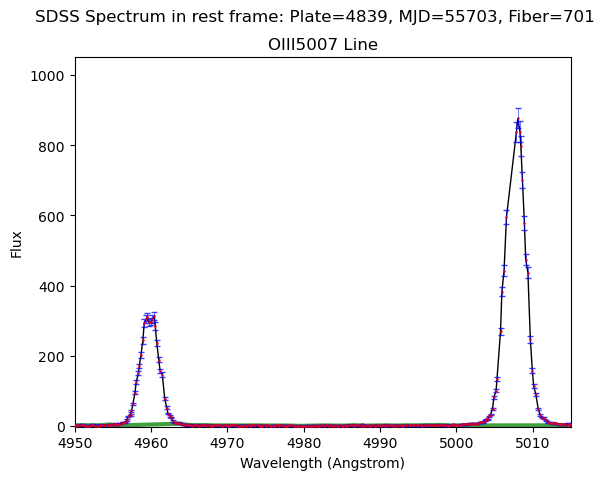

8049 8351
[8.15504938e-01 2.55893373e+02 2.56050290e+00 6.64815937e+01
 5.00000000e+02 1.47505421e-24 9.44389118e-04]


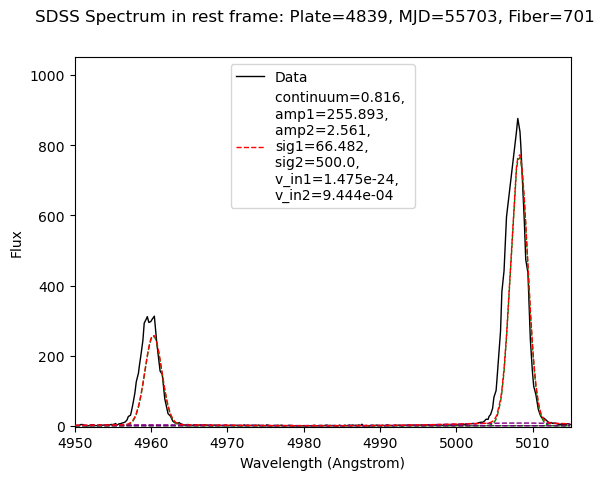

35
4851-55680-128


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


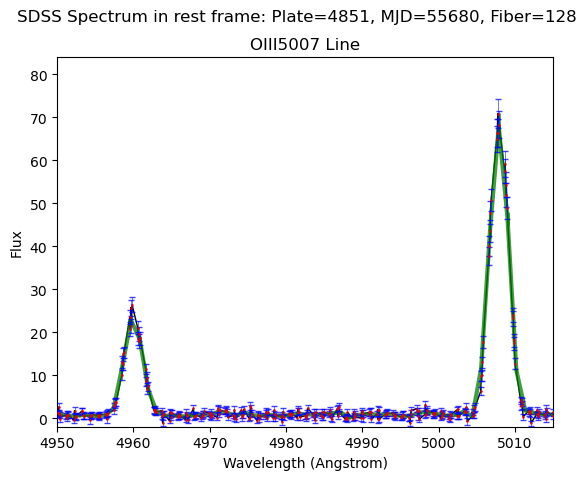

8174 8485
[7.32639466e-01 2.24551685e+01 1.79438458e-01 6.82533706e+01
 1.31435682e+03 4.47129103e-07 7.25560741e+05]


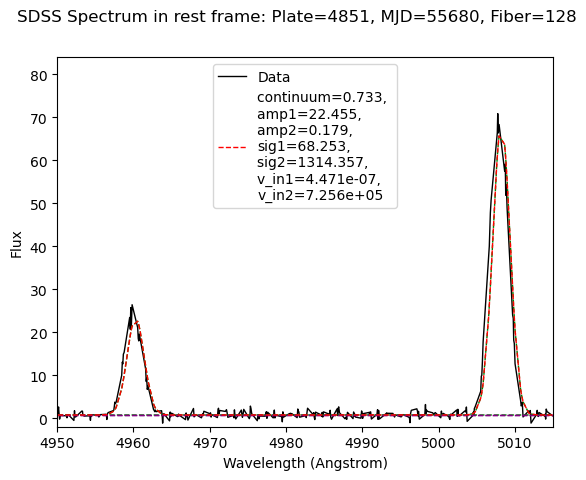

36
4895-55708-827


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


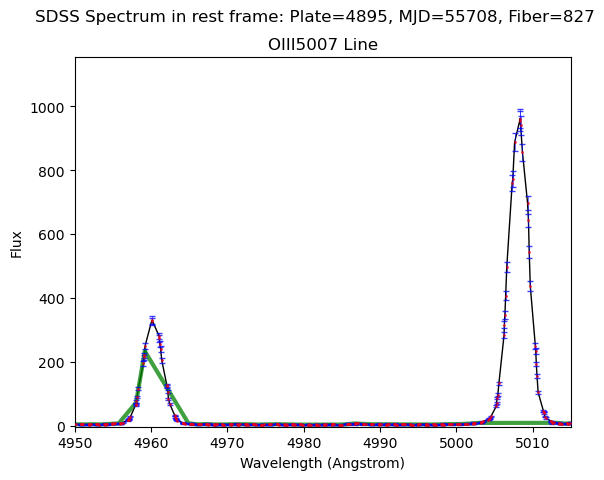

8421 8729
[4.86883627e+00 3.19104479e+02 1.47155812e+00 7.57686696e+01
 5.00000000e+02 1.07055085e-14 5.38964696e+01]


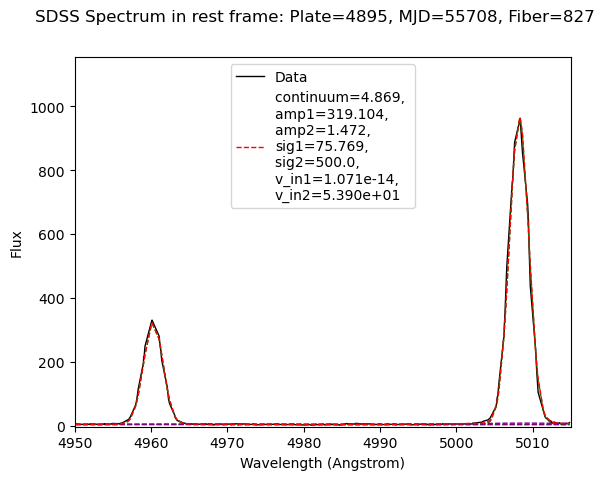

37
4977-56047-184


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


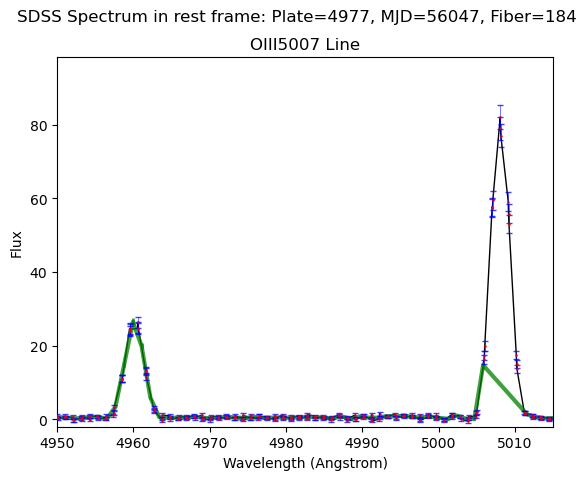

4739 4925
[4.38061140e-01 2.74454029e+01 3.91178103e-01 6.85279911e+01
 1.15873747e+03 2.27097063e-13 1.72747036e+04]


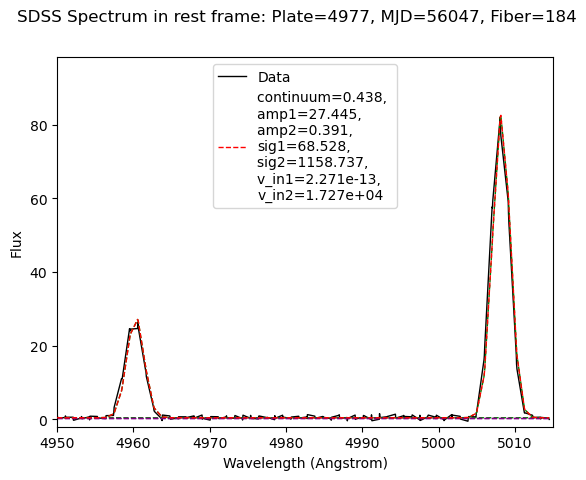

38
5133-55860-203


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


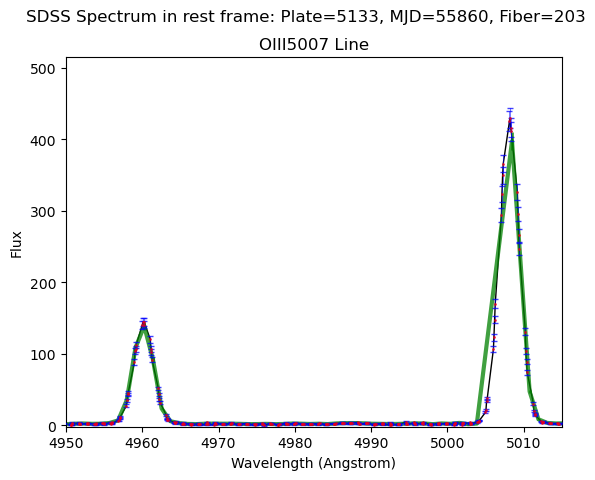

6558 6806
[2.03921578e+00 1.40493142e+02 2.26792564e-01 7.61390434e+01
 5.00000000e+02 1.58422579e-16 2.96131332e-13]


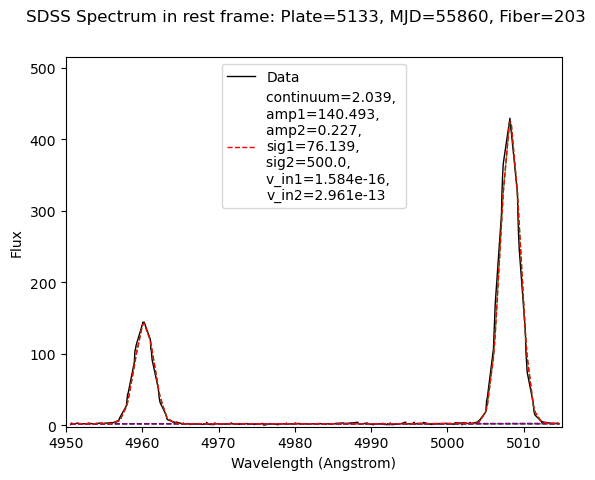

39
5297-55913-379


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


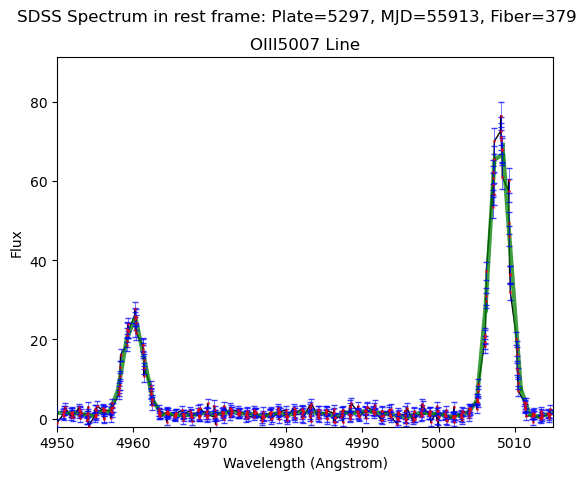

11528 11962
[1.08601257e+00 2.34576230e+01 1.45212311e-01 7.38785571e+01
 5.00000045e+02 2.03769970e-20 1.55560635e+03]


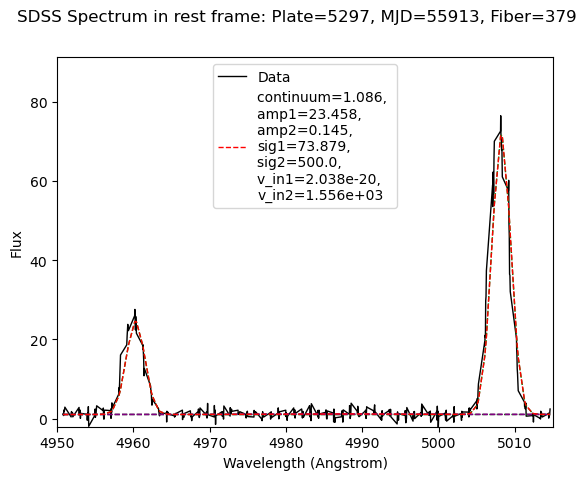

40
5316-55955-108


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


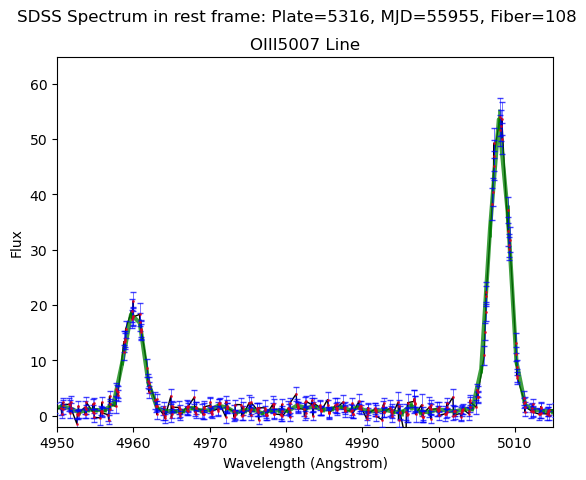

8643 8958
[9.78923087e-01 1.76113337e+01 1.02560398e+00 7.03922790e+01
 9.70877323e+02 4.77599468e-09 1.70384431e+05]


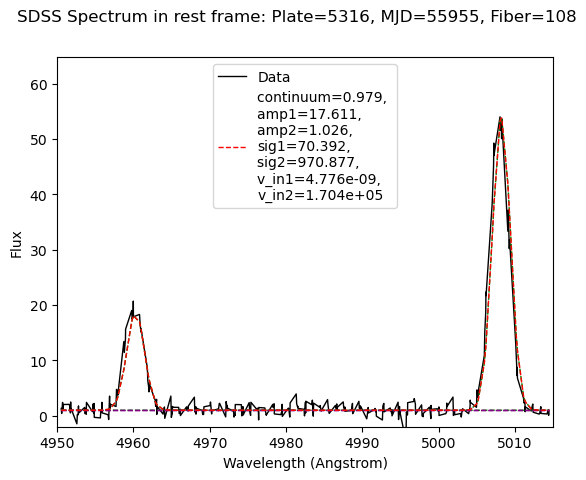

41
5695-55978-162


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


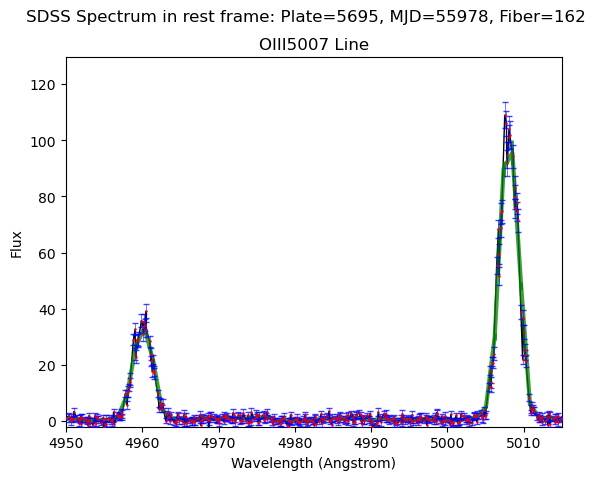

11020 11448
[6.05911153e-01 3.37622450e+01 4.72352404e-02 7.07549528e+01
 7.18973024e+02 6.40413137e-07 7.15758779e+05]


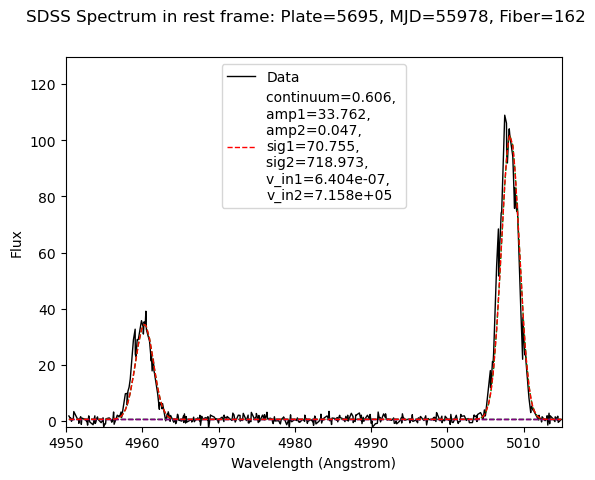

42
5900-56043-511


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


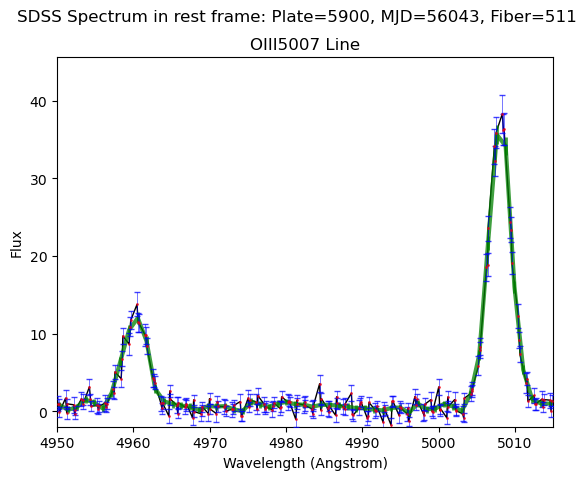

4746 4935
[5.52194314e-01 1.19849005e+01 1.78625334e+00 8.99663455e+01
 1.00139391e+03 4.03518340e-01 6.99172248e+05]


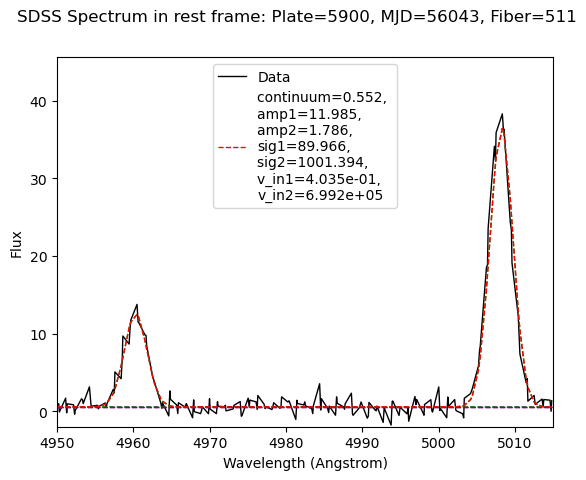

43
5974-56314-346


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


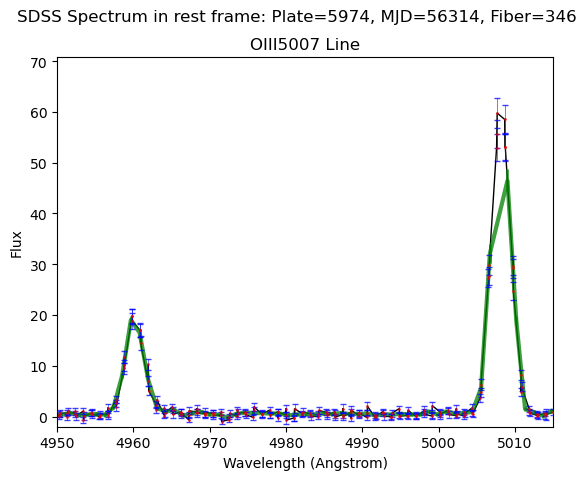

4642 4825
[1.11754312e-01 2.01211265e+01 9.32390275e-02 7.30190189e+01
 4.99999769e+03 3.62129557e-30 3.58391264e-14]


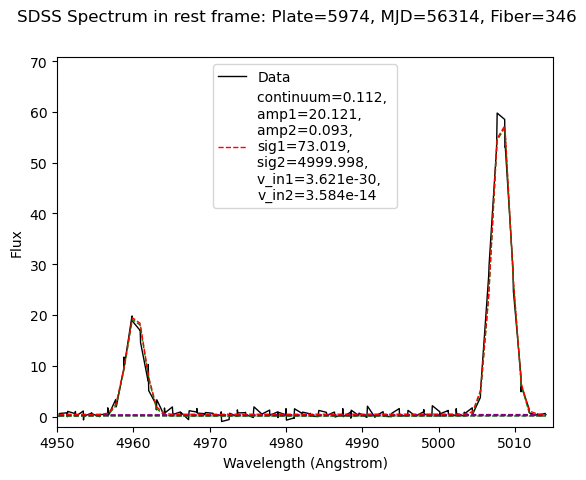

44
6254-56268-654


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


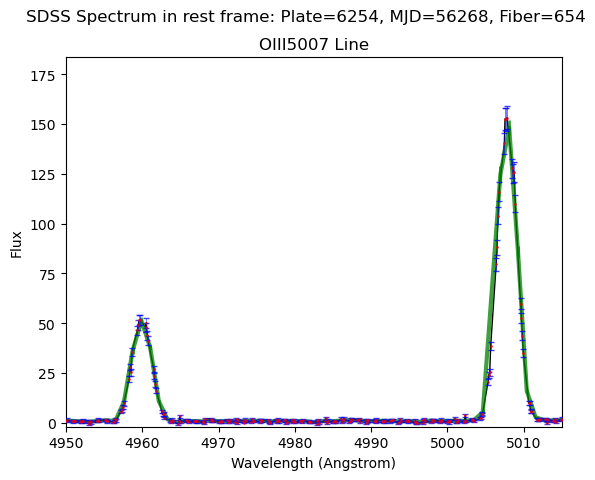

5835 6077
[7.75124492e-01 4.88227823e+01 3.50920593e-01 6.98512658e+01
 5.00000022e+02 8.05377434e-40 2.63761417e+03]


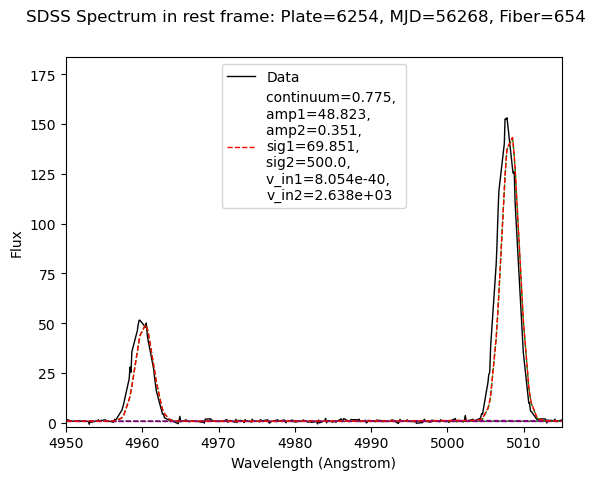

45
6262-56267-718


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


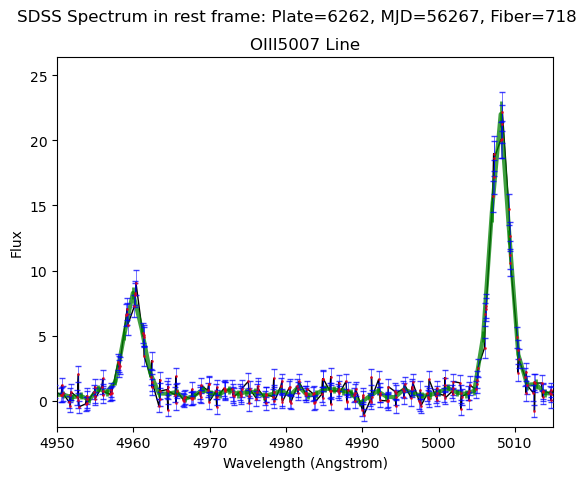

5883 6127
[5.01566472e-01 6.98712302e+00 1.16511264e+00 7.23616878e+01
 8.64588651e+02 2.27204308e-01 3.11032866e+05]


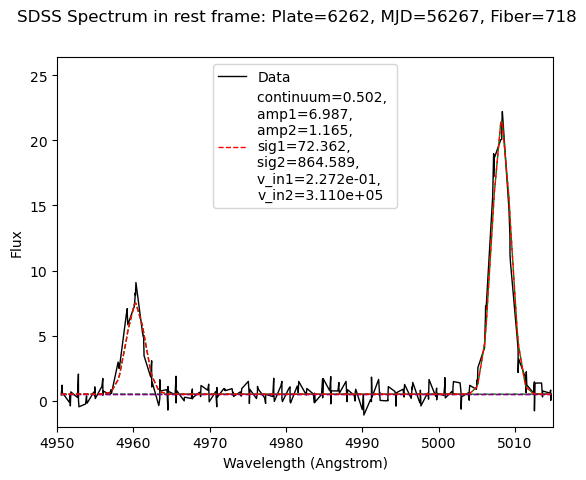

46
6272-56325-512


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


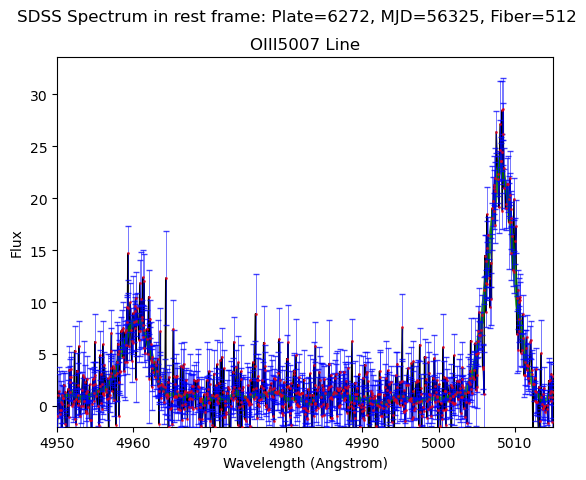

20063 20915
[7.81054860e-01 7.39872739e+00 9.52434101e-01 1.00168560e+02
 8.41595416e+02 2.58942797e+00 7.13971362e+05]


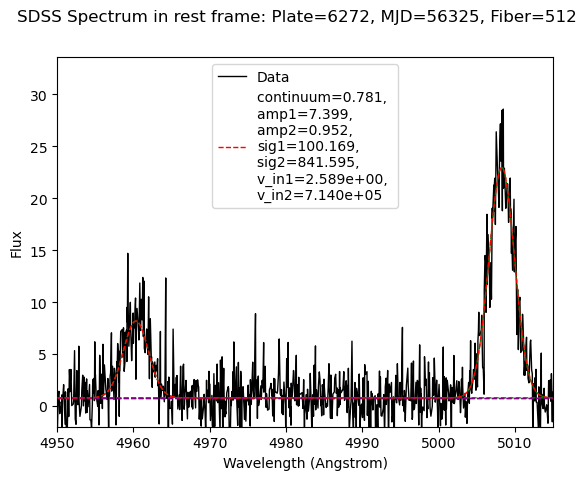

47
6311-56447-384


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


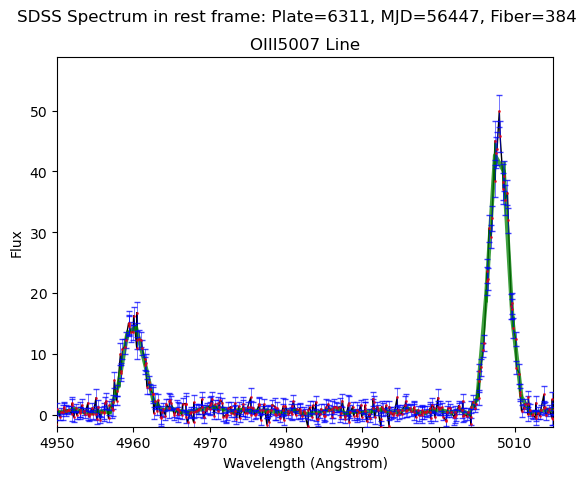

9067 9433
[4.73914874e-01 1.45482728e+01 1.16244165e+00 7.33294017e+01
 8.60933456e+02 6.23472633e-07 9.89286064e+03]


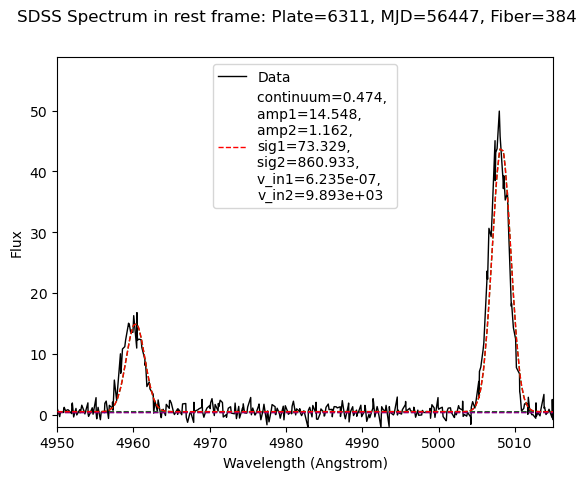

48
6409-56306-367


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


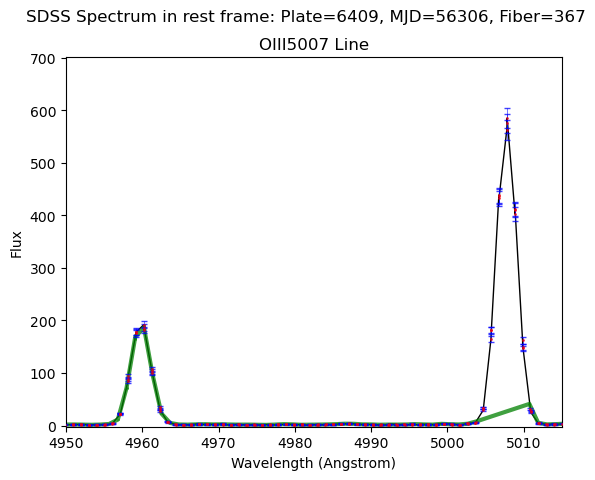

5076 5262
[2.12615319e+00 1.72886780e+02 4.24921931e-01 7.02551089e+01
 5.00000000e+02 1.00060727e-13 5.05982295e-07]


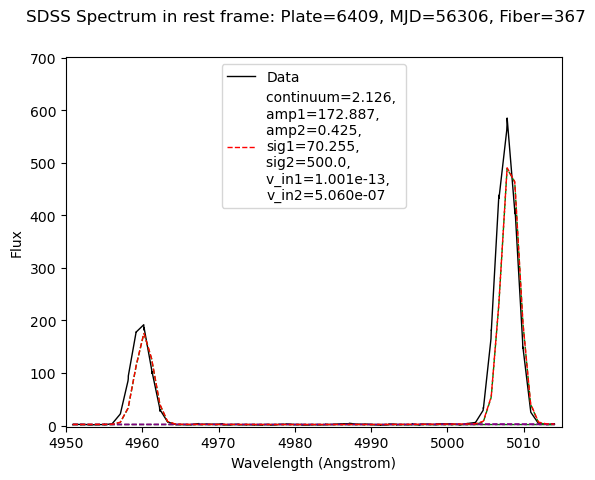

49
6445-56366-516


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


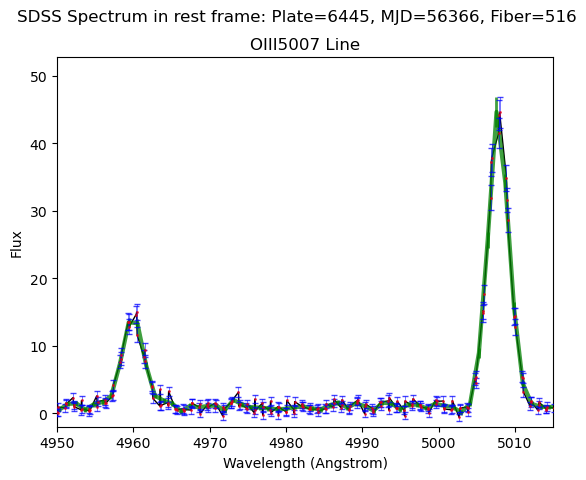

4863 5052
[9.29421769e-01 1.32554373e+01 2.07470773e-10 8.37628938e+01
 4.99989079e+03 4.01484540e-10 5.72246816e-02]


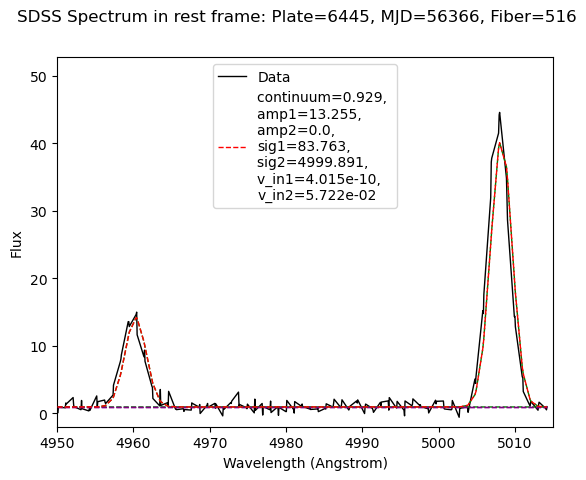

50
6445-56366-937


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


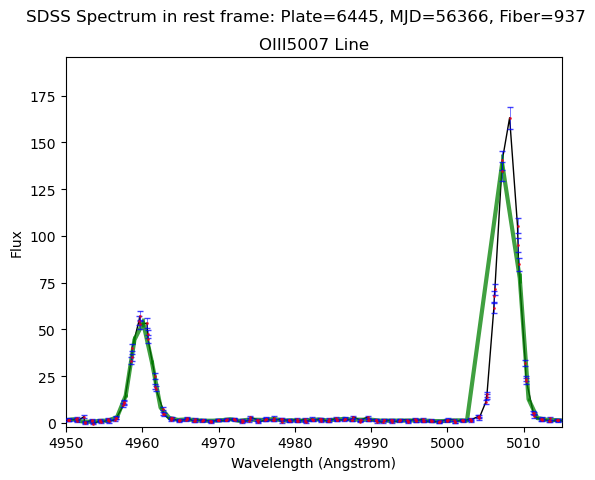

4884 5070
[1.47806383e+00 5.15978554e+01 2.59177710e-05 7.16416540e+01
 5.00933443e+02 3.22425191e-10 5.98145579e+04]


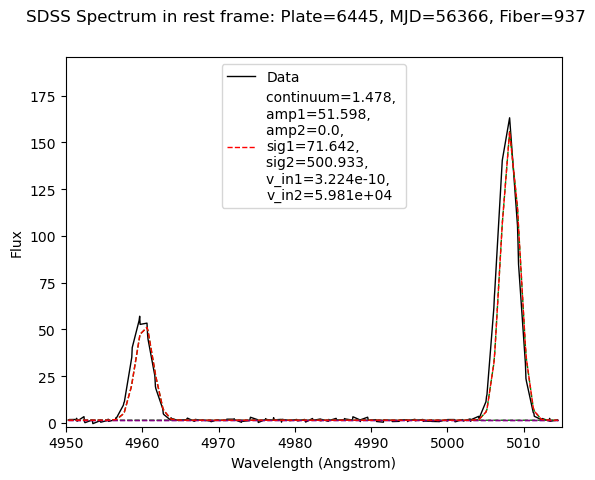

51
6480-56340-570


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


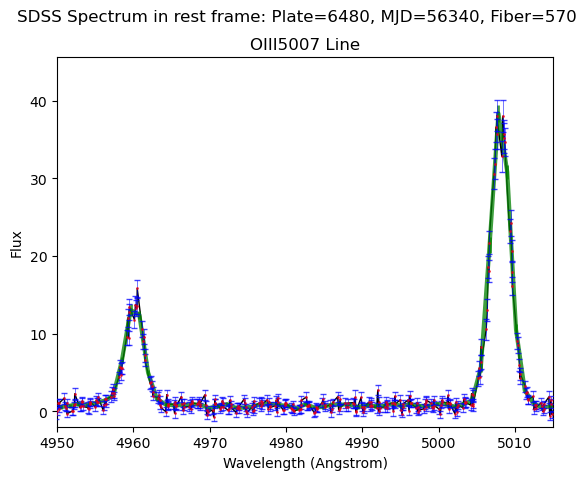

8392 8707
[7.00096658e-01 1.23949234e+01 1.11501238e+00 7.58078249e+01
 8.89875145e+02 6.81343828e-05 2.79452823e+04]


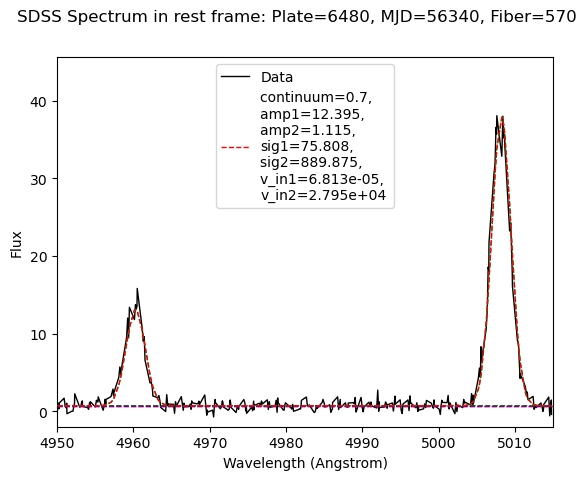

52
6512-56567-344


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


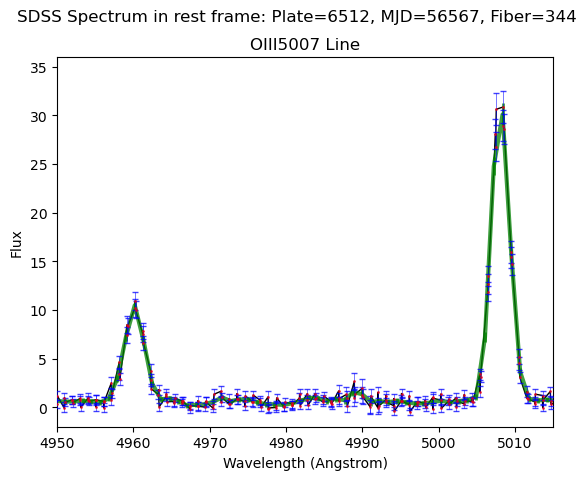

5175 5365
[5.67852331e-01 1.01252655e+01 1.69947712e+00 7.19808185e+01
 8.14729184e+02 9.35005630e-01 7.15491585e+05]


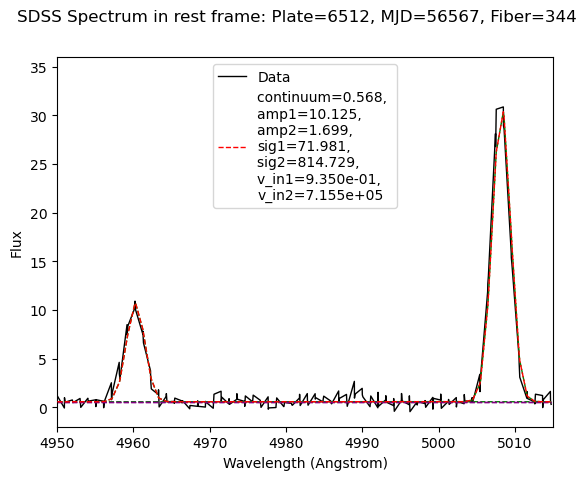

53
6513-56543-640


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


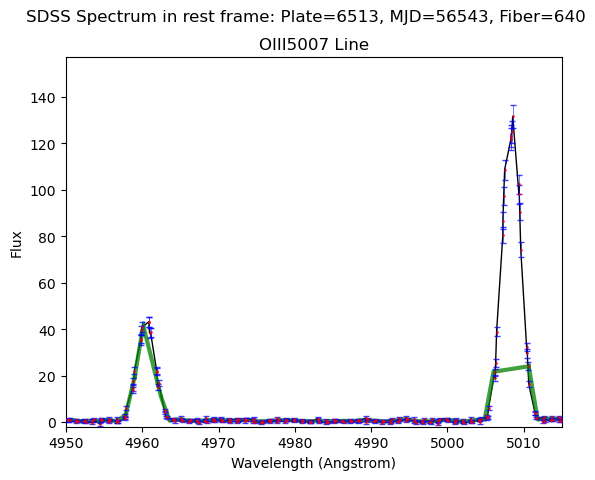

6092 6340
[5.16513895e-01 4.45844357e+01 4.99999982e+00 6.80846174e+01
 5.00000001e+02 9.42180922e+00 4.36522601e+03]


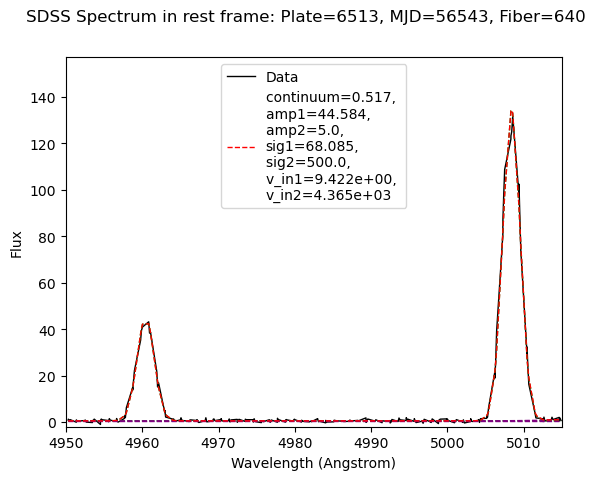

54
6514-56487-217


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


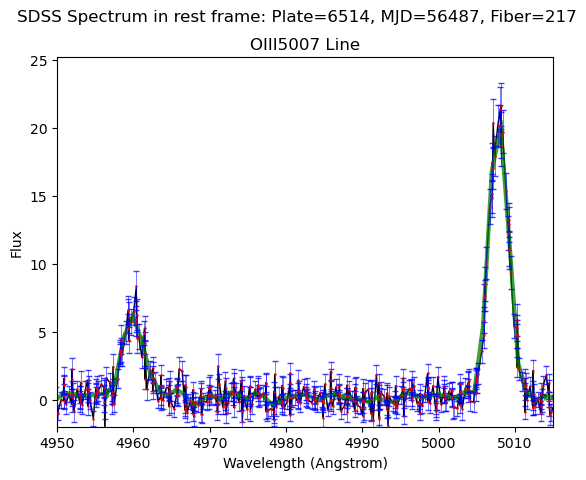

10817 11245
[9.51490752e-02 6.39015875e+00 6.92098048e-01 7.70018089e+01
 7.21818351e+02 6.44698209e-02 7.14114635e+05]


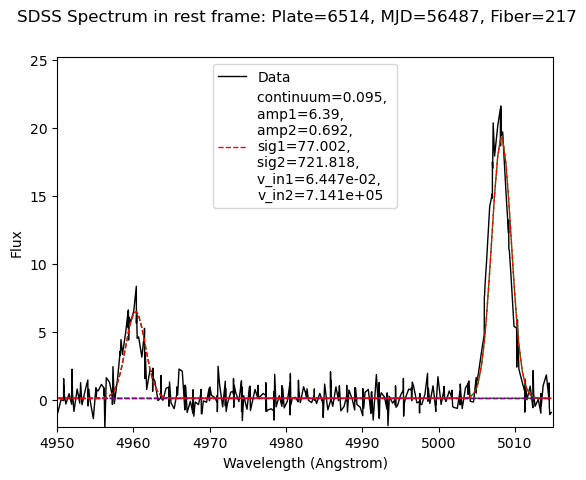

55
6518-56567-726


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


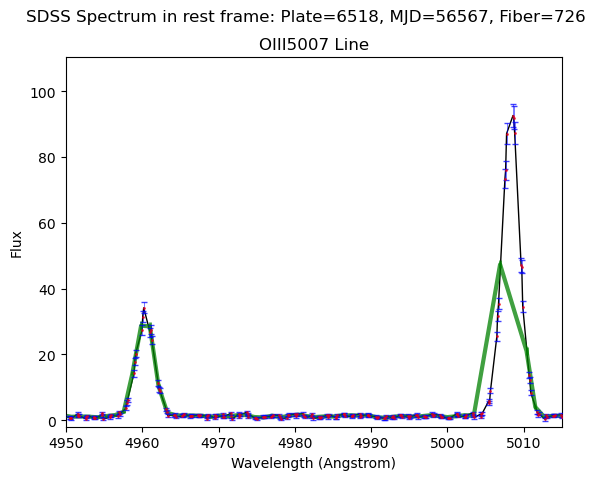

4557 4741
[4.54527968e-01 3.08861095e+01 1.90743368e-01 6.96058838e+01
 4.99999967e+03 4.42325077e+00 3.45683284e-08]


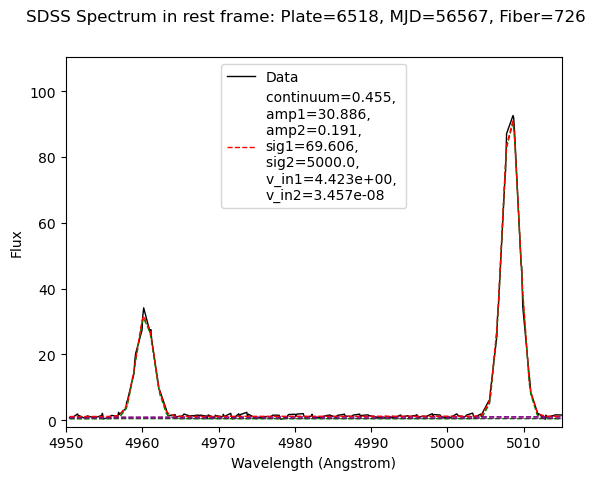

56
6521-56537-132


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


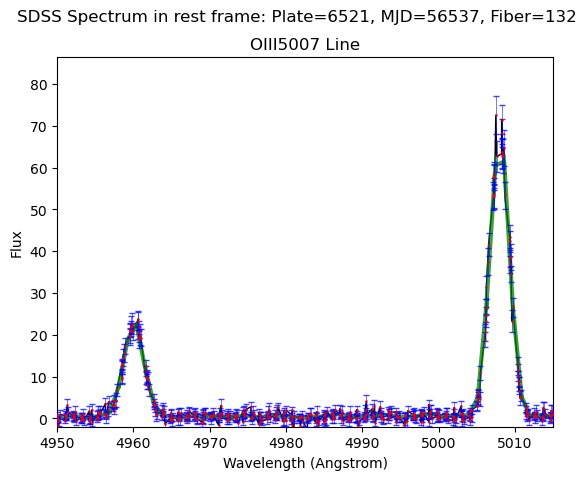

12405 12898
[3.44285331e-08 2.22047644e+01 1.23933727e-01 7.32130175e+01
 3.95396374e+03 2.71145661e-34 3.01576686e-22]


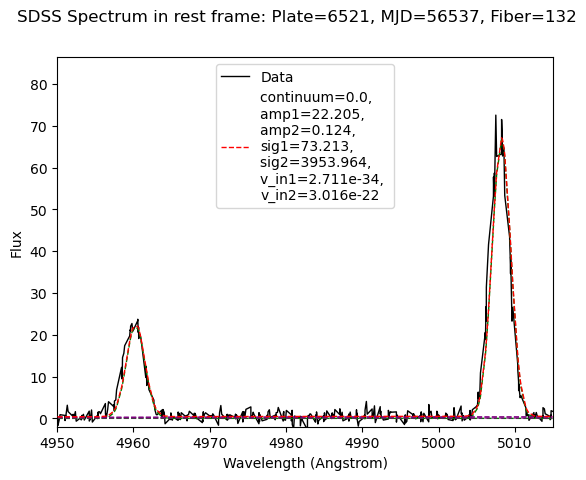

57
6694-56386-172


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


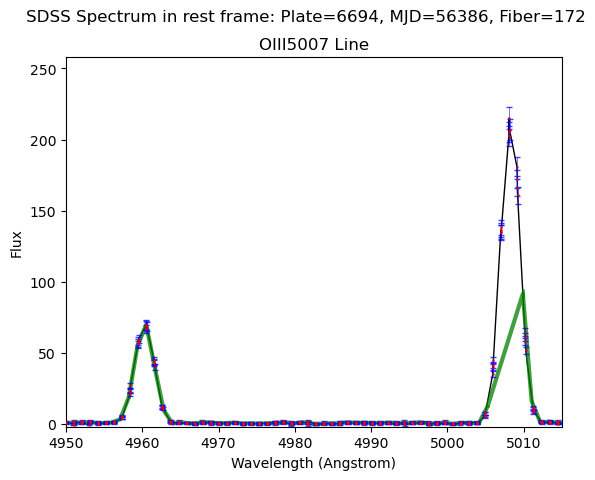

6303 6548
[5.68975312e-01 7.18364634e+01 2.78885662e+00 7.33688211e+01
 6.53809457e+02 2.00292923e-04 3.63126209e+04]


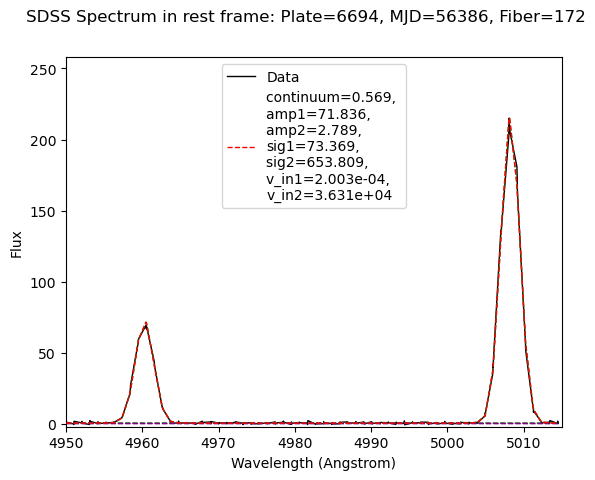

58
6715-56449-448


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


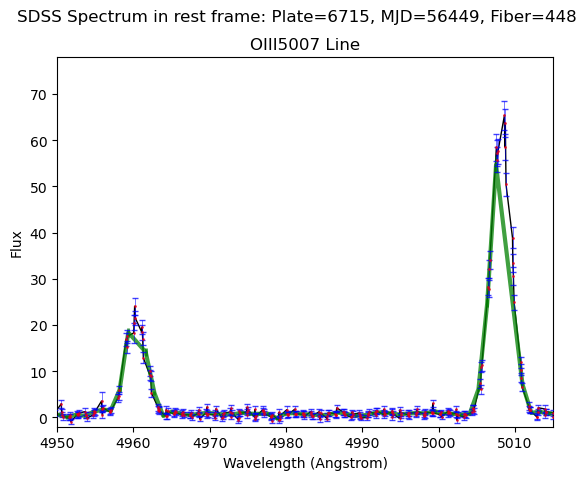

6211 6453
[7.07014050e-01 2.10134172e+01 5.00000000e+00 7.80571594e+01
 5.00000000e+02 2.32144343e-13 4.53321609e+03]


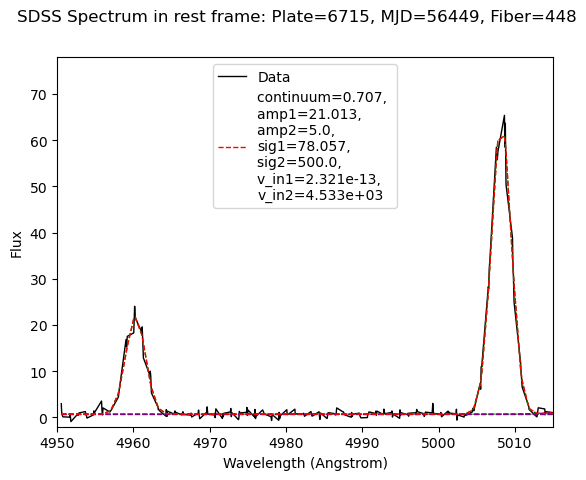

59
6975-56720-648


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


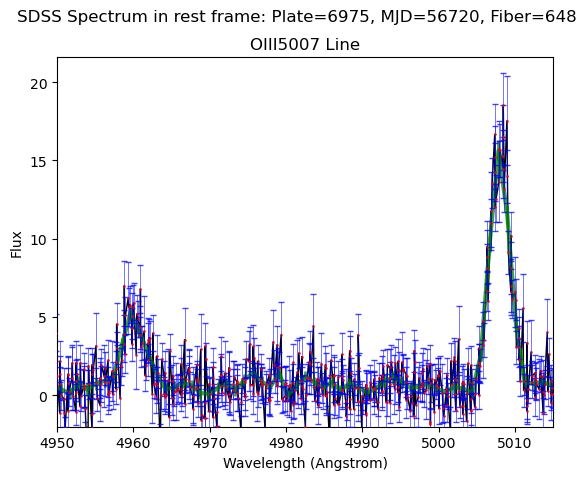

12163 12657
[4.83432867e-01 4.90378201e+00 8.21770211e-01 7.80590054e+01
 8.51850459e+02 1.37717702e+00 7.16109651e+05]


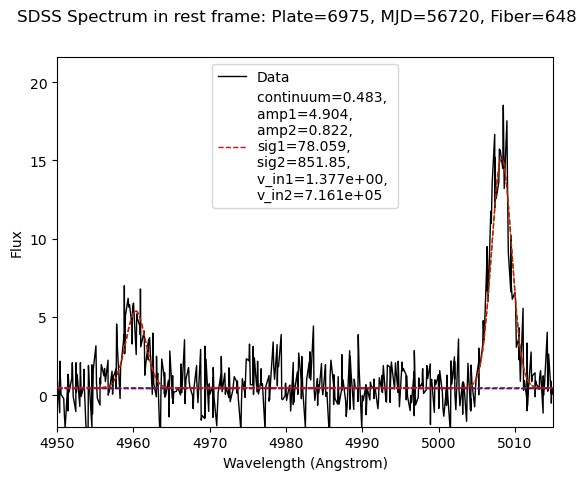

60
7027-56448-420


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


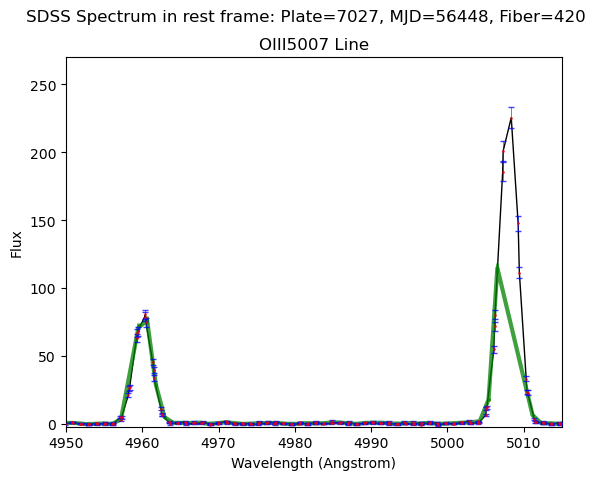

4566 4745
[5.12428706e-01 7.95542121e+01 2.65441363e-04 6.66093377e+01
 5.01913789e+02 7.61479747e-10 7.77079192e+03]


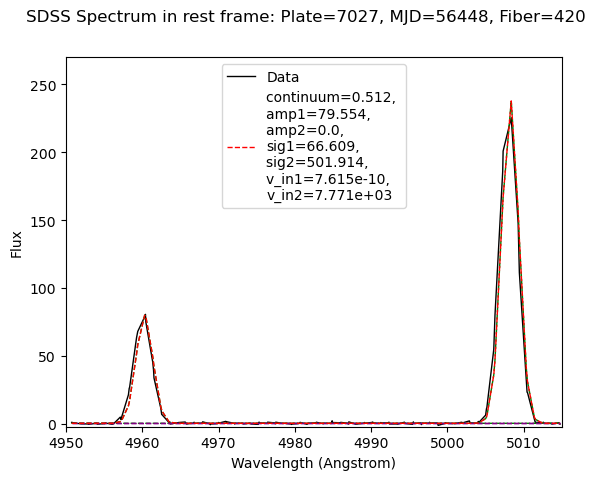

61
7034-56564-540


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


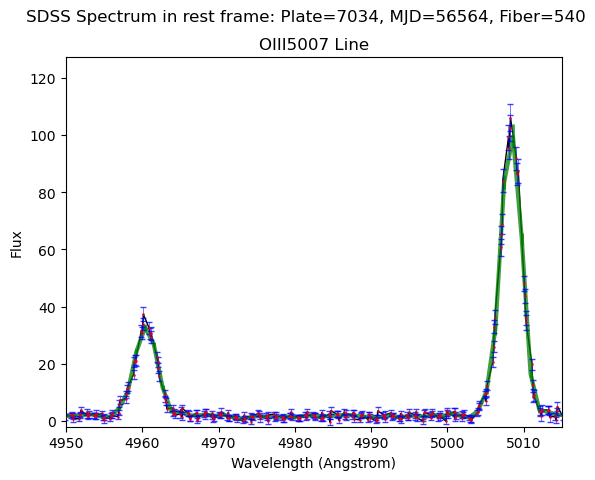

6688 6939
[1.60262101e+00 3.28982730e+01 2.36942771e-01 8.29143874e+01
 5.00000000e+02 5.44939227e+00 8.78917069e+01]


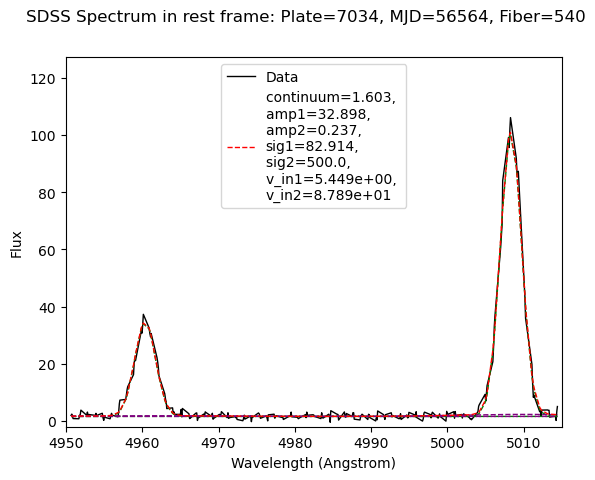

62
7081-56684-1000


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


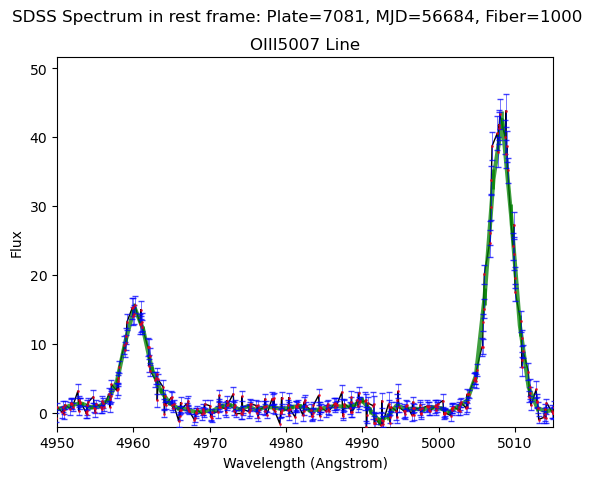

8471 8790
[6.46692964e-01 1.40099971e+01 6.69889478e-02 9.27609228e+01
 1.20303137e+03 4.25094082e-03 4.23182152e+04]


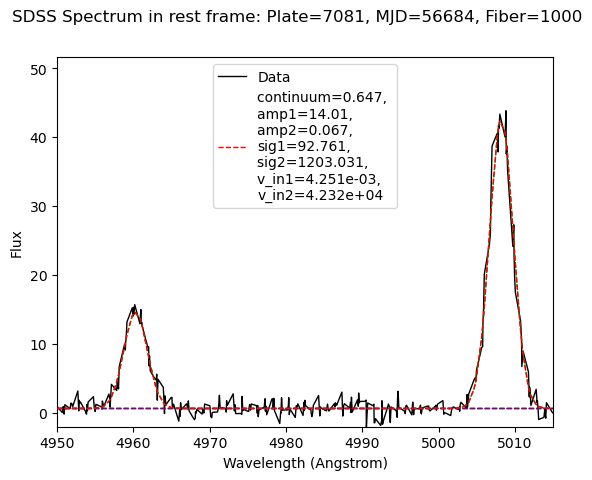

63
7151-56598-404


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


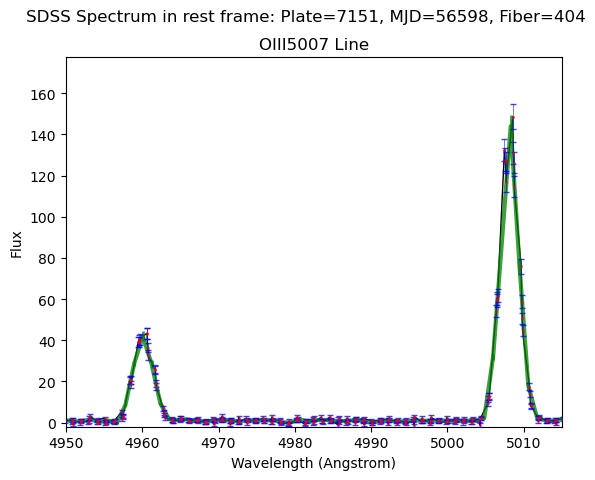

5606 5842
[7.25380231e-01 4.54466715e+01 4.97500000e+00 7.26708977e+01
 9.14185417e+02 5.62078502e-07 1.30690240e+04]


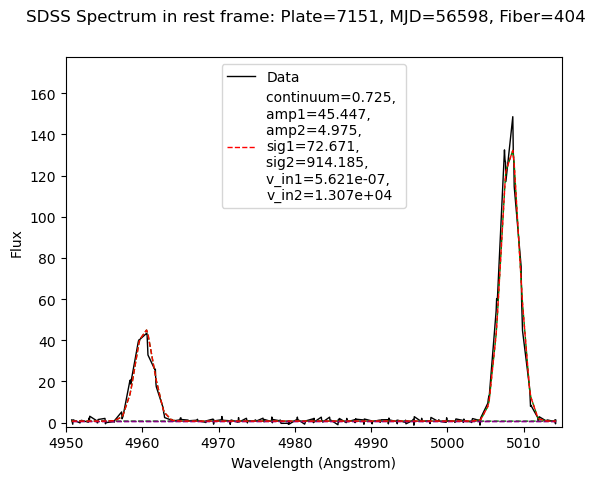

64
7153-56904-861


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


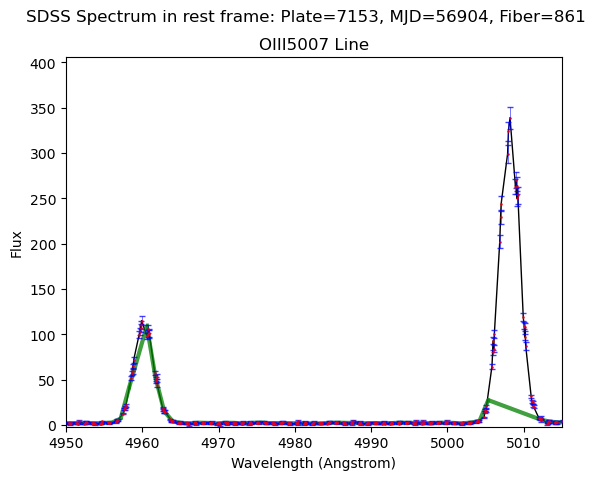

8311 8622
[1.93588174e+00 1.09089496e+02 1.51411273e-01 7.64928479e+01
 5.00000006e+02 6.03637748e-27 3.85296488e+01]


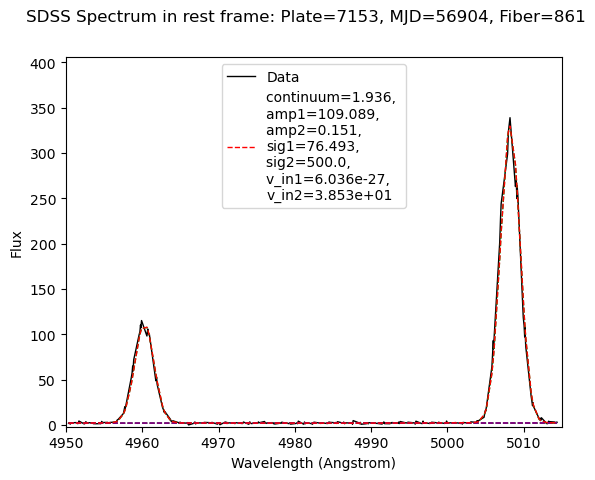

65
7289-57039-102


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


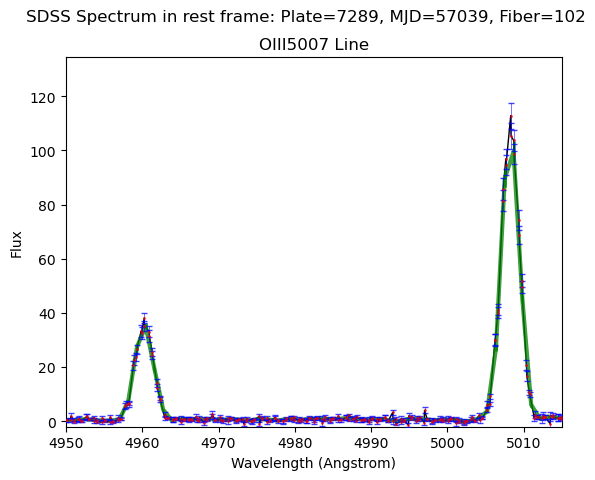

6815 7068
[5.75528421e-01 3.68759838e+01 4.99999999e+00 6.84830659e+01
 5.00000000e+02 4.39625250e-10 4.28217566e+03]


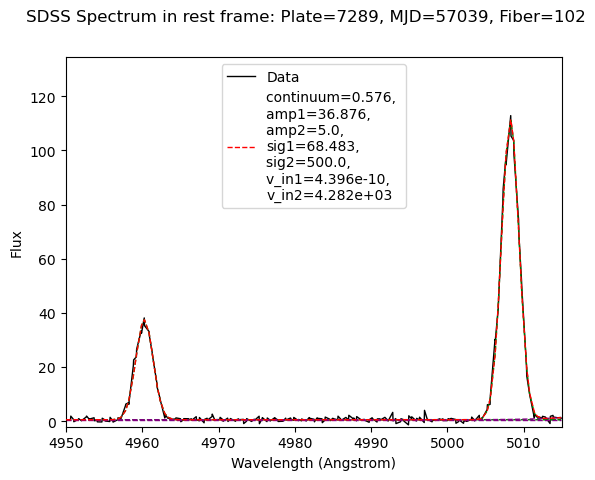

66
7315-56685-165


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


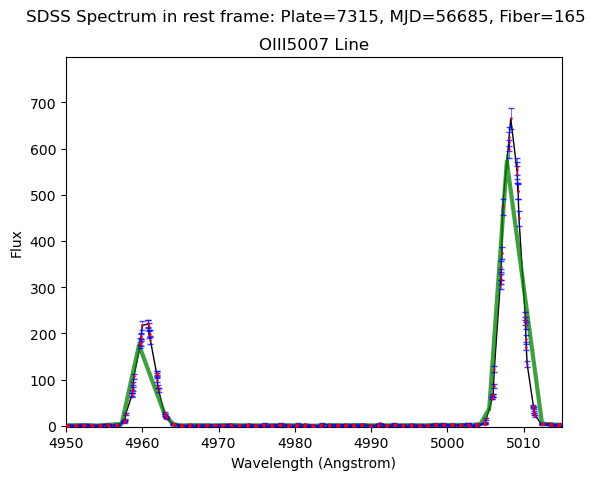

8946 9310
[7.16302644e-01 2.23354040e+02 5.23610740e-01 6.96047625e+01
 6.97001327e+02 1.17248446e+01 2.54803443e+02]


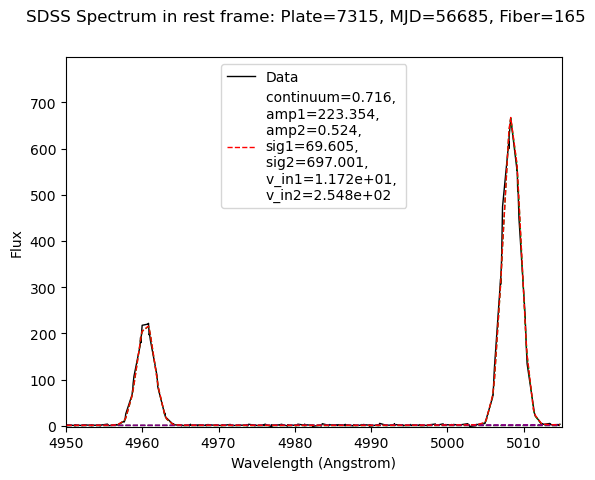

67
7336-56656-363


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


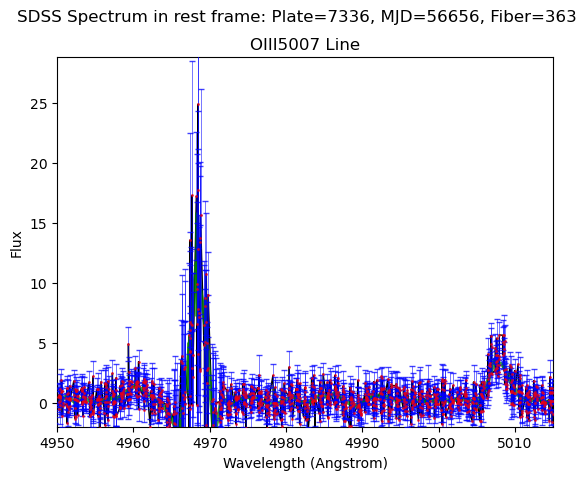

33228 34397
[1.38991242e-01 1.15975383e+00 1.04190684e+00 7.09551573e+01
 8.69091982e+02 4.87400728e-02 1.36924280e+04]


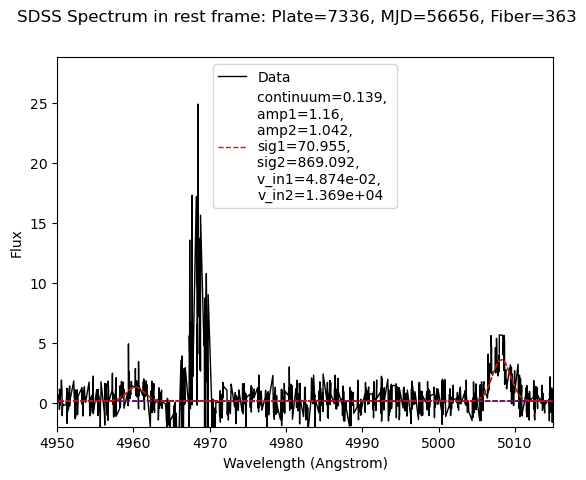

68
7396-56809-782


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


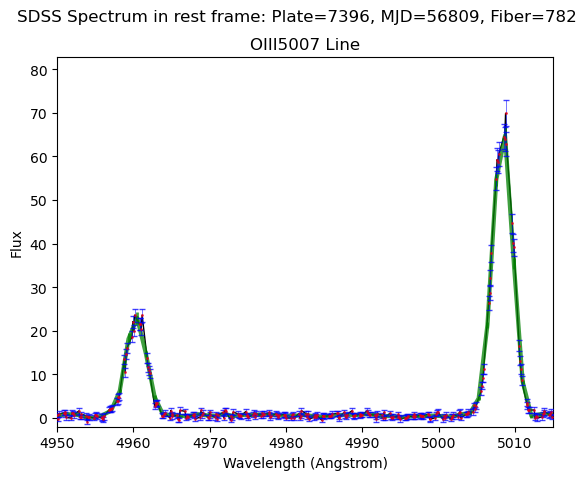

7344 7605
[5.30648591e-01 2.27046025e+01 4.99999999e+00 7.64888739e+01
 5.00000000e+02 7.58757141e+00 4.63742558e+03]


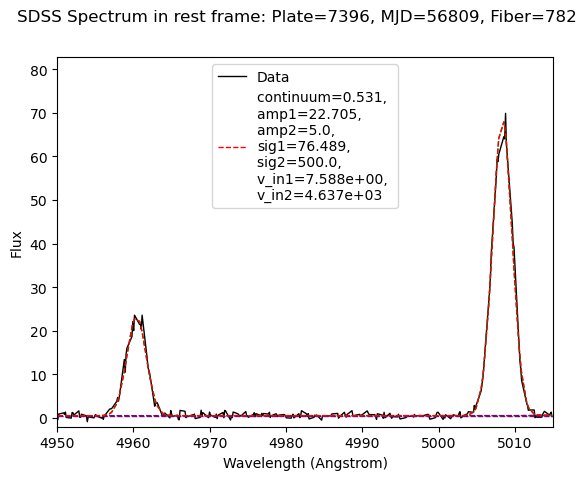

69
7404-56776-446


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


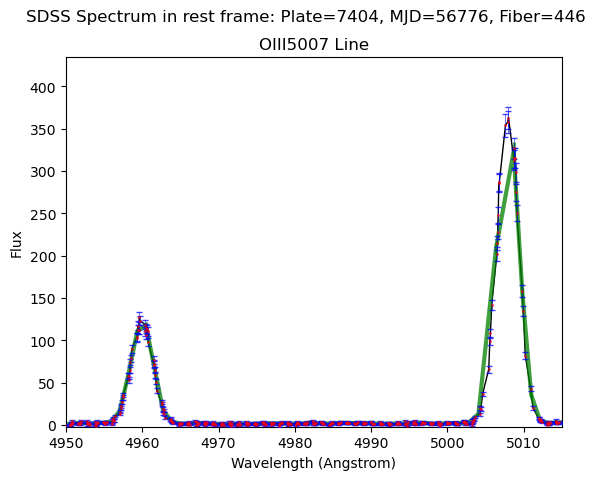

9489 9882
[1.51354981e+00 1.16607146e+02 2.31562404e-01 8.34429637e+01
 8.56210610e+02 1.22358488e-17 1.09151343e-17]


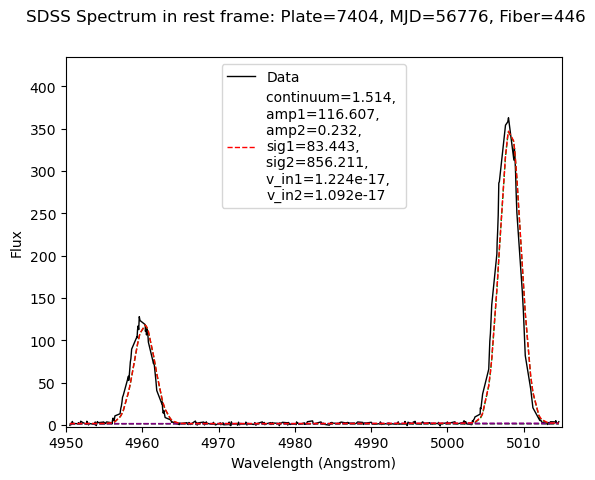

70
7427-56751-620


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


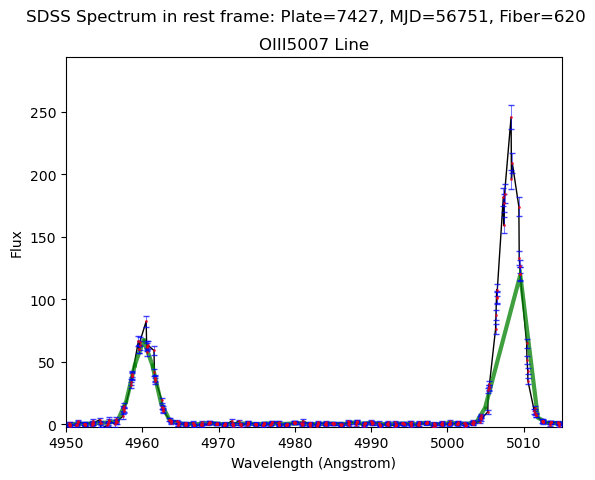

8614 8930
[2.29718663e-01 7.00356944e+01 2.16385809e-01 8.03159248e+01
 8.05339870e+02 1.25939835e-21 2.54785059e+03]


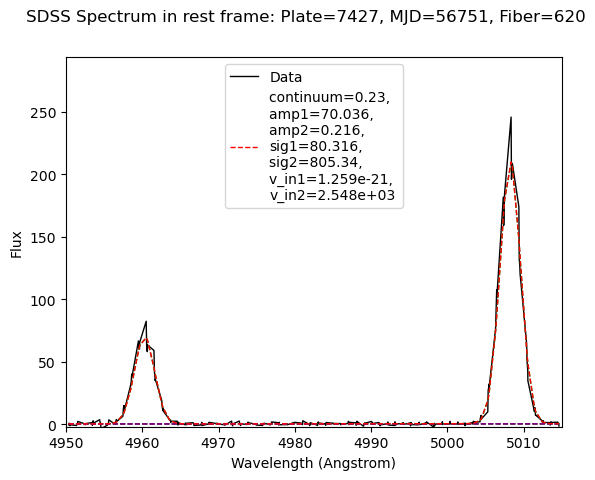

71
7572-56944-383


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


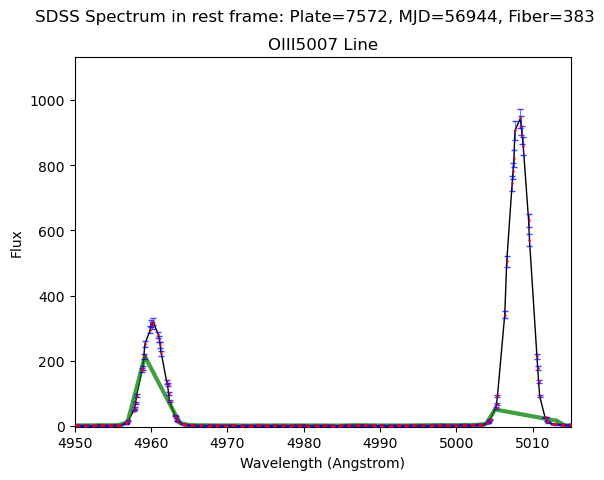

5877 6114
[1.80113968e+00 3.24445418e+02 7.09020141e-01 7.66153094e+01
 5.00000000e+02 2.75514670e-15 1.78940861e+01]


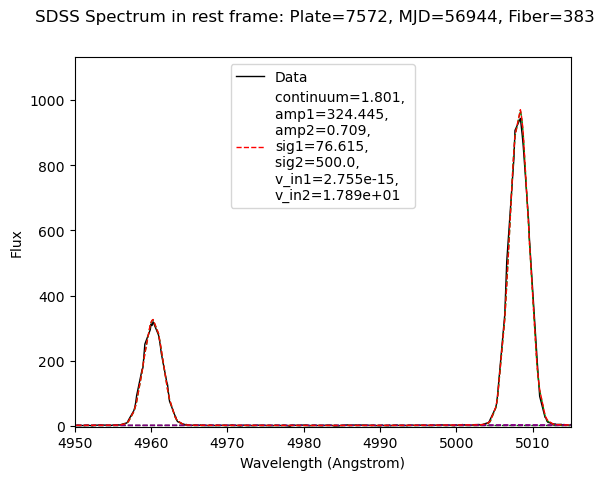

72
7581-56949-122


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


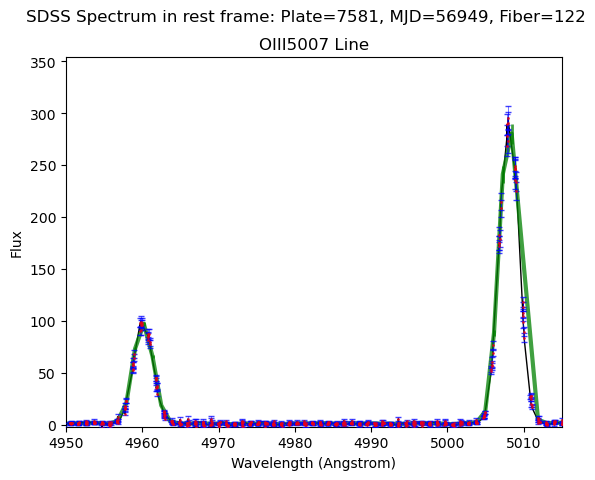

12259 12703
[9.74045075e-01 9.65057032e+01 5.98215137e-02 7.47585752e+01
 5.00000000e+02 1.80950243e-13 1.49113159e-10]


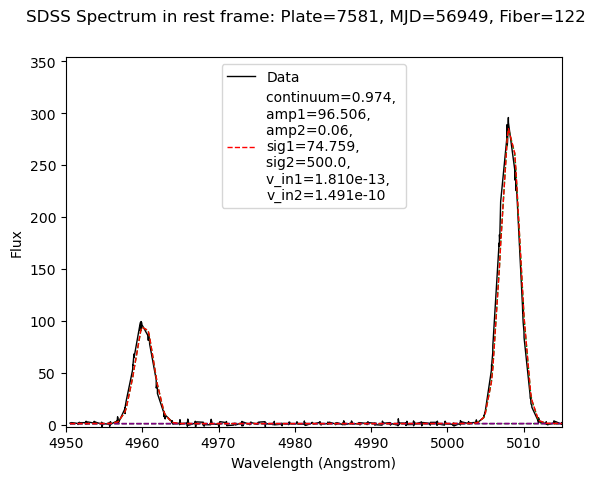

73
7626-56934-72


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


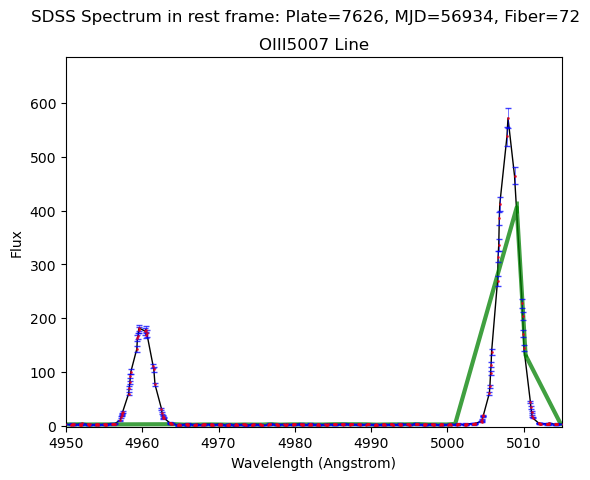

7358 7647
[2.02426381e+00 1.95009908e+02 2.07812019e-01 6.99805109e+01
 7.42125411e+02 6.36807435e-16 7.29287898e-08]


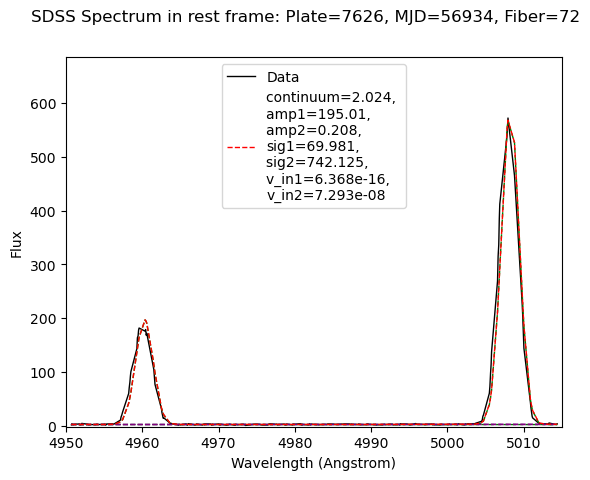

74
7629-56988-135


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


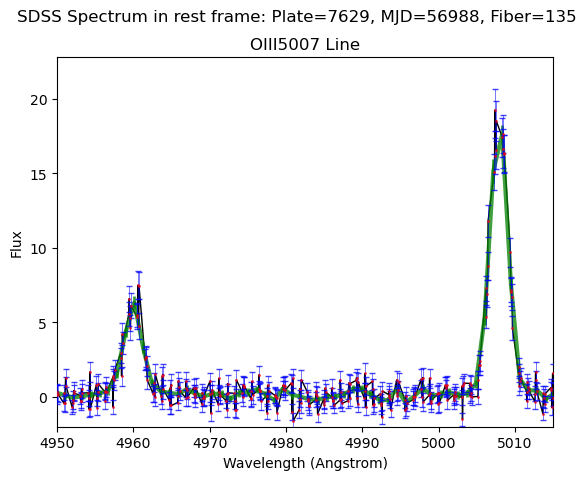

7689 7995
[1.09913354e-01 5.95670131e+00 6.93921086e-01 6.95557957e+01
 7.18830502e+02 6.39997205e-02 7.14297732e+05]


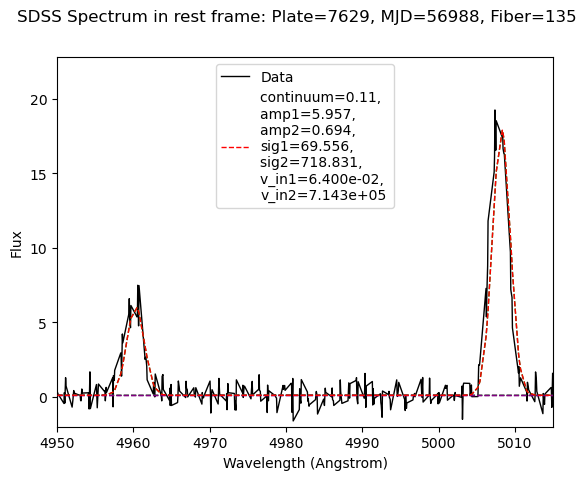

75
7643-57302-720


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


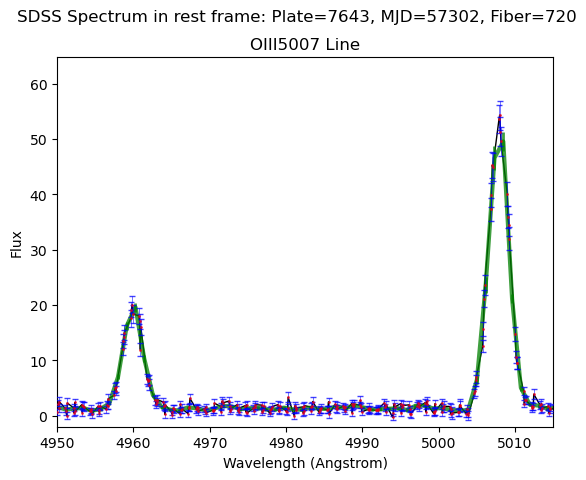

5745 5989
[1.23581698e+00 1.68393955e+01 1.49626736e-01 7.53982212e+01
 5.00000000e+02 3.08263909e-37 2.38452865e+03]


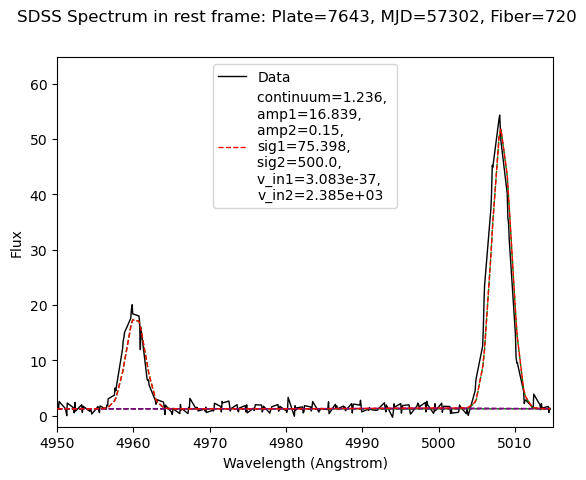

76
7653-57306-686


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


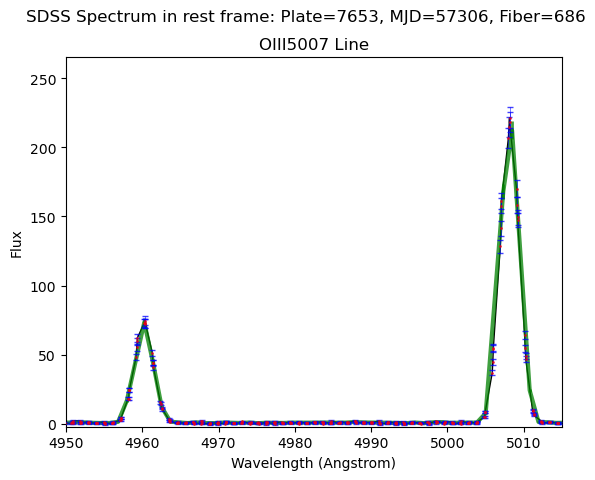

5984 6228
[7.66847247e-01 7.29895312e+01 1.84619603e-01 7.25073313e+01
 5.00000001e+02 7.18378384e-14 1.75542070e+03]


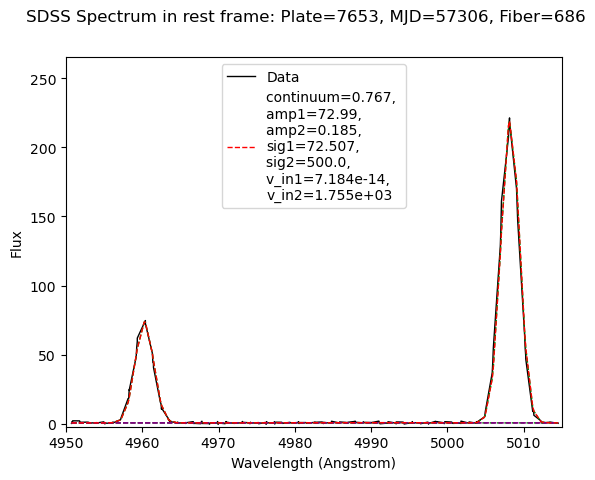

77
7661-57286-304


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


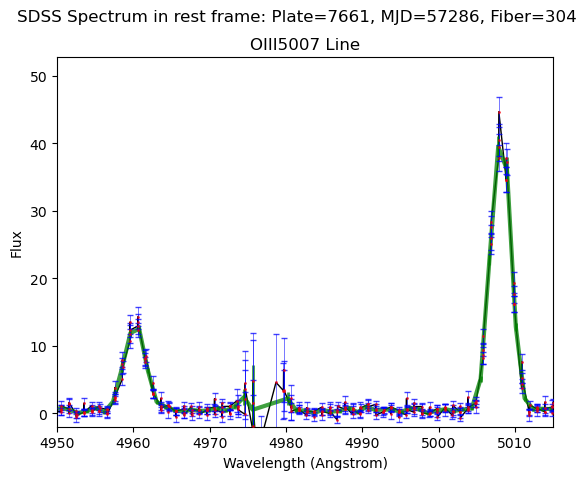

7320 7571
[4.09522549e-01 1.36934968e+01 8.28037186e-01 7.75468135e+01
 8.04062577e+02 4.02283019e-05 1.12182974e+04]


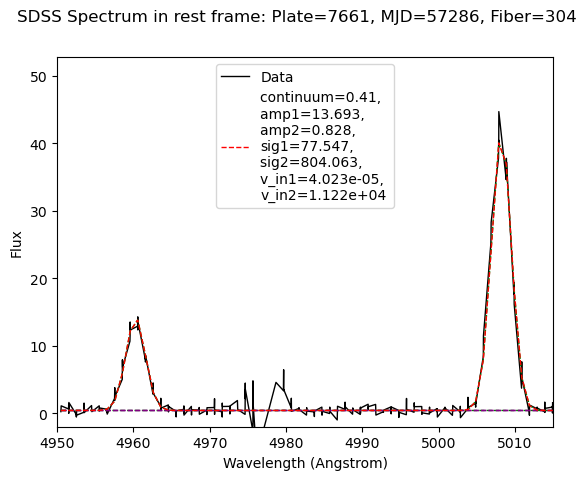

78
7673-57329-421


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


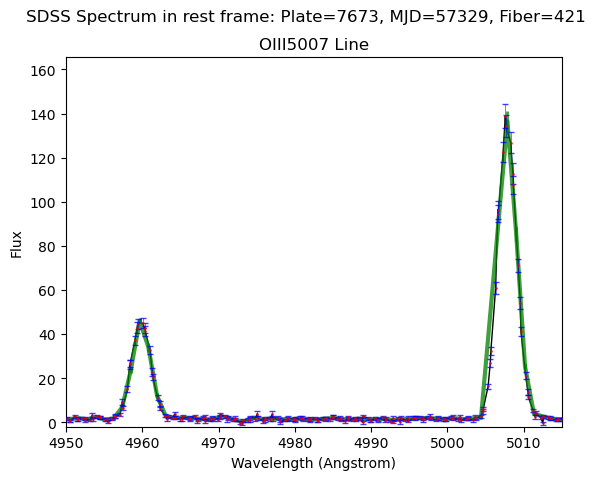

5814 6012
[1.57465003e+00 4.05602549e+01 3.73965257e-02 7.15659704e+01
 9.65327348e+02 1.39248453e-07 1.04977619e+04]


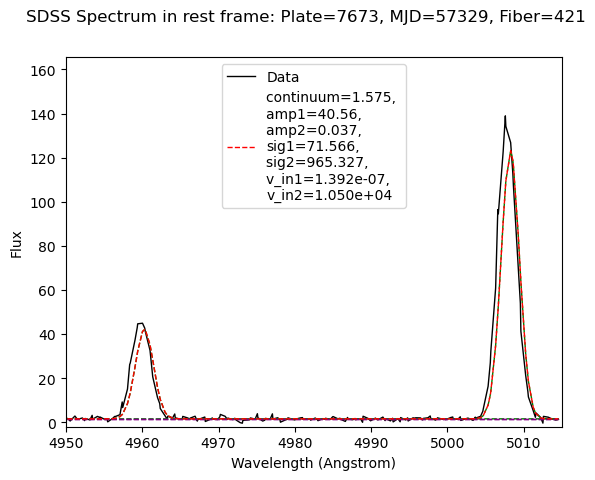

79
7678-57282-159


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


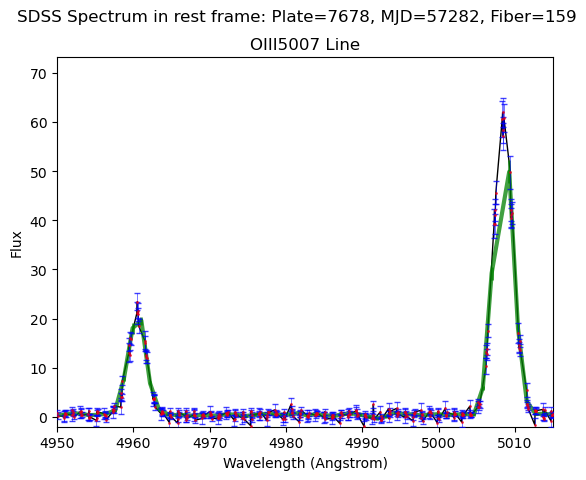

7641 7947
[3.73167855e-01 2.00054014e+01 1.25977650e-01 7.32453252e+01
 5.00000000e+02 1.34791653e+01 3.13417534e+03]


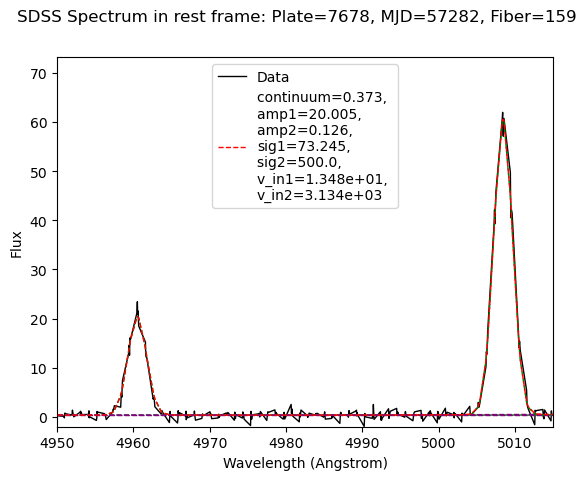

80
7690-57046-910


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


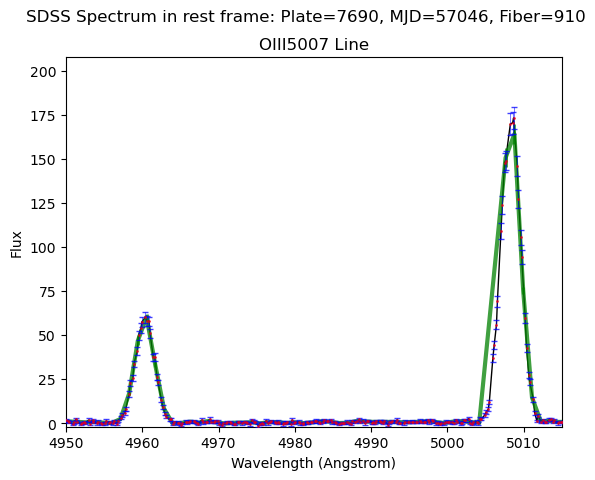

6003 6247
[3.31776552e-01 6.03444266e+01 3.77096078e-01 7.36303038e+01
 5.00000001e+02 2.58238962e+00 2.10927705e+03]


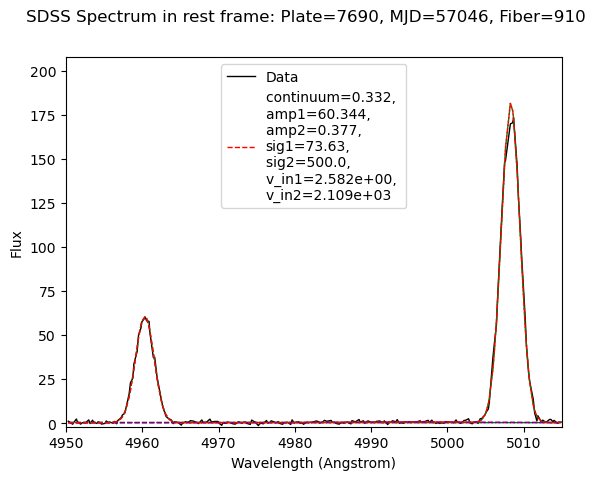

81
7710-58284-291


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


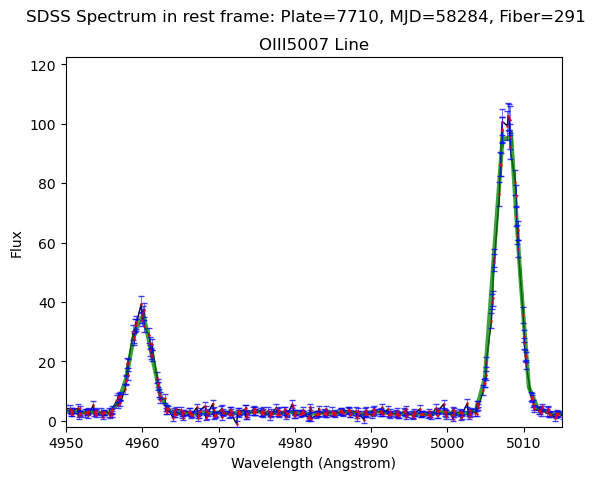

9612 9981
[2.59485089e+00 3.16516564e+01 1.83662305e-05 7.80813832e+01
 5.00000018e+02 5.06478929e-12 1.01239360e-10]


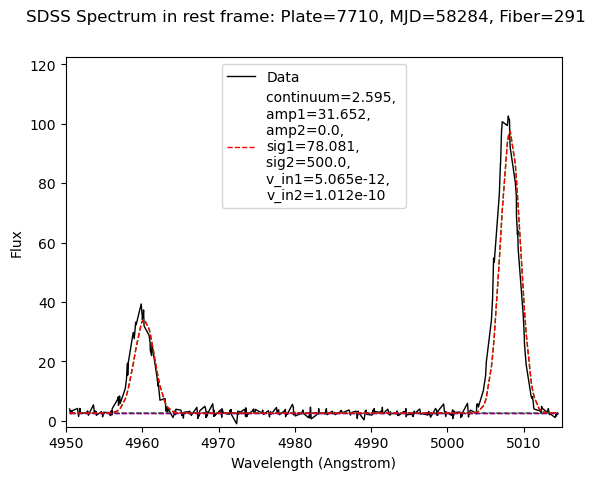

82
7711-57667-88


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


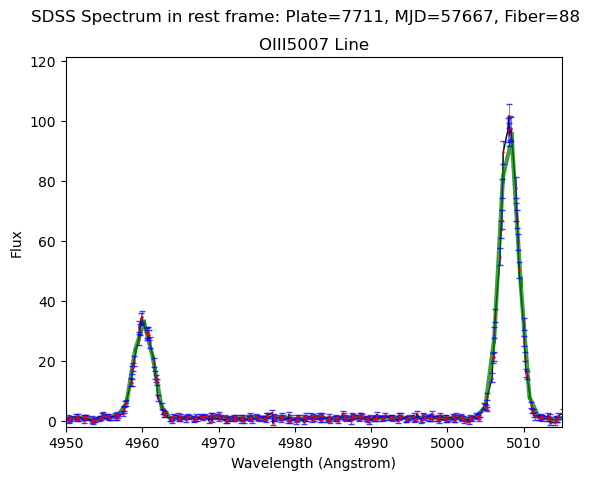

8466 8781
[7.81617570e-01 3.24344374e+01 2.18720414e-01 6.96953621e+01
 5.00000000e+02 3.27661663e-33 2.19874618e+03]


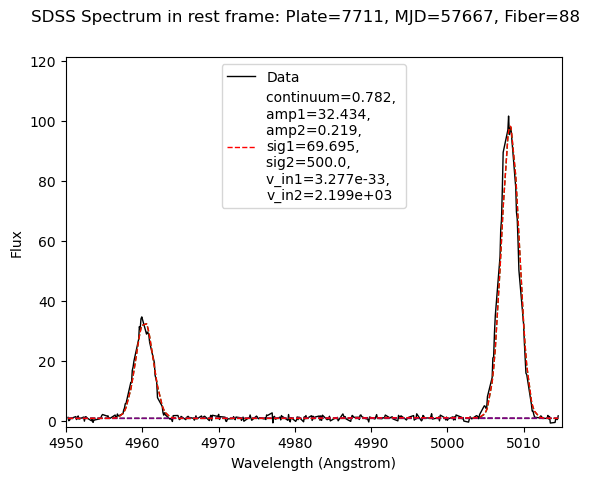

83
7885-57336-549


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


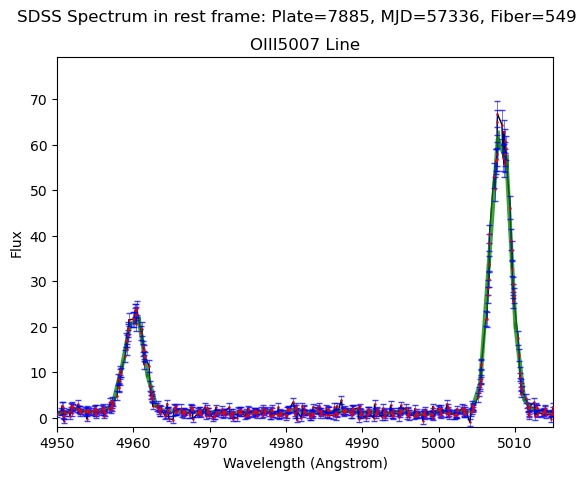

12247 12740
[1.13942489e+00 2.13127702e+01 8.41392172e-02 7.49330040e+01
 5.05653980e+02 6.49019705e-06 5.67043157e+04]


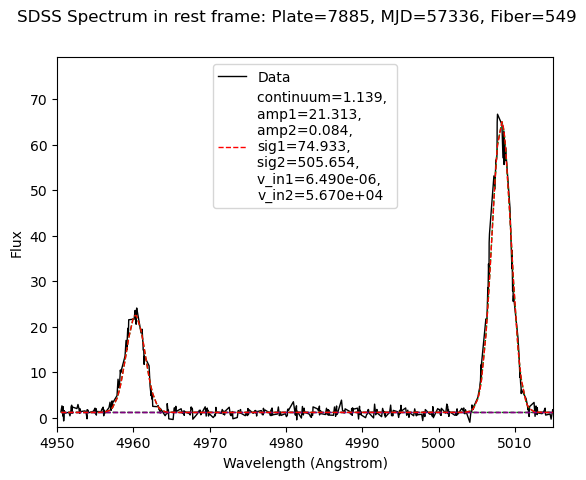

84
8054-57194-43


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


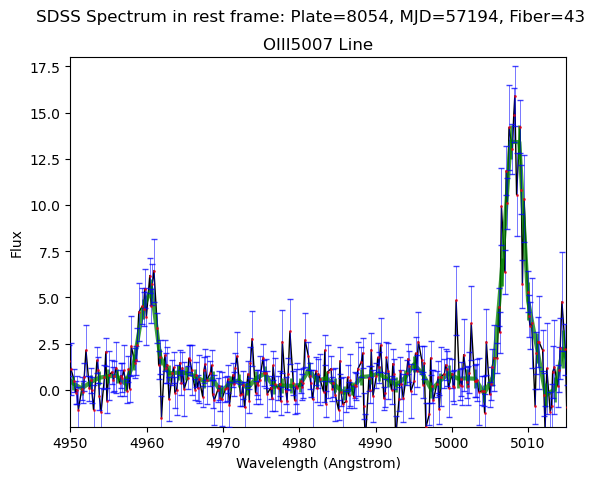

7566 7828
[4.03812674e-01 4.78852099e+00 1.07156988e+00 6.65180615e+01
 8.51328969e+02 2.79484167e-03 1.13105917e+04]


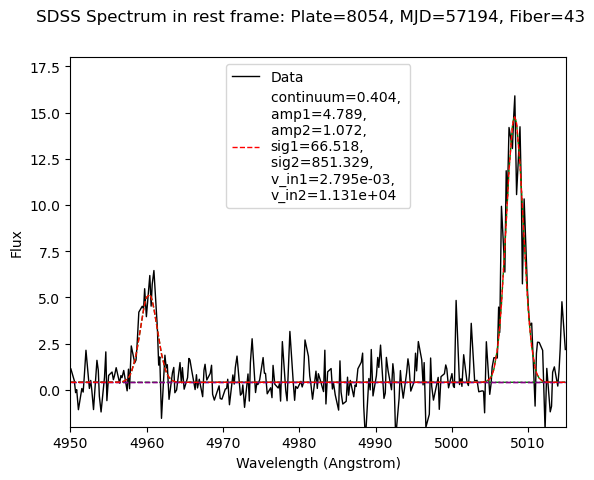

85
8057-57190-545


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


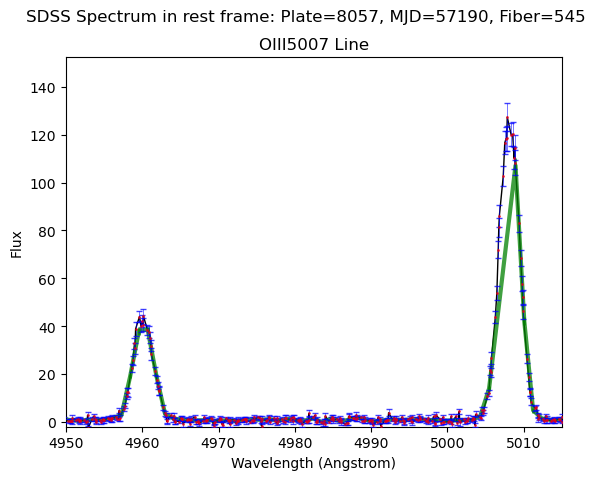

7990 8303
[7.32988904e-01 4.24481384e+01 6.07159885e-03 7.61919530e+01
 1.10863885e+03 5.29610883e-10 2.40822379e+04]


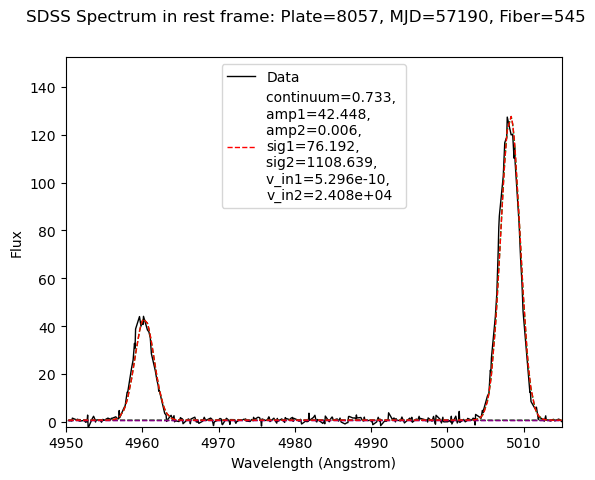

86
8059-57895-836


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


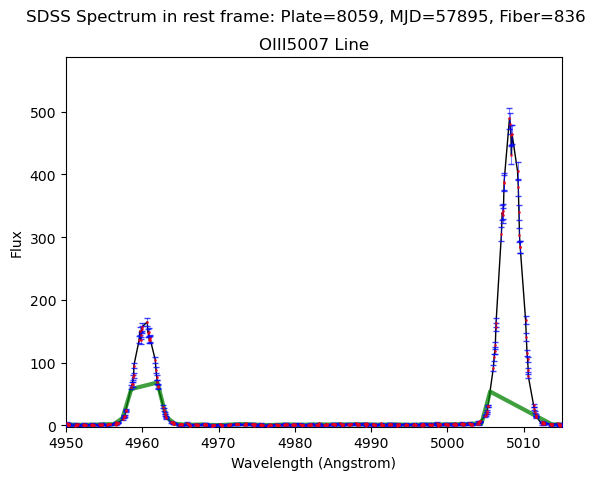

9061 9432
[1.00251157e+00 1.59641199e+02 2.31405983e-01 7.51094324e+01
 9.43411002e+02 3.47790229e+00 1.23498230e-11]


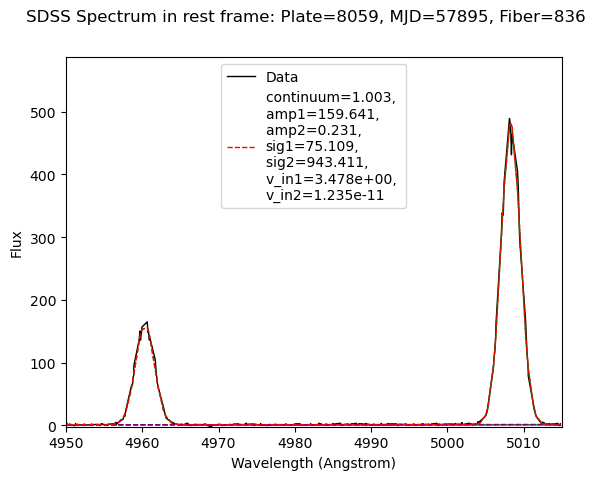

87
8213-58487-916


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


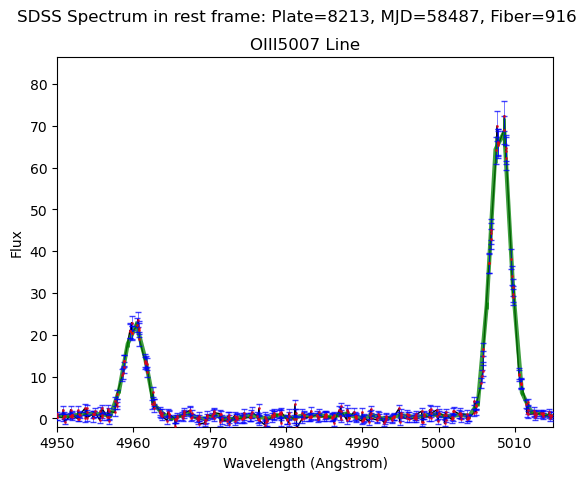

9627 9959
[4.20033397e-01 2.35192944e+01 3.19883972e-01 7.44681780e+01
 5.00000000e+02 3.29250562e-11 3.15893815e+03]


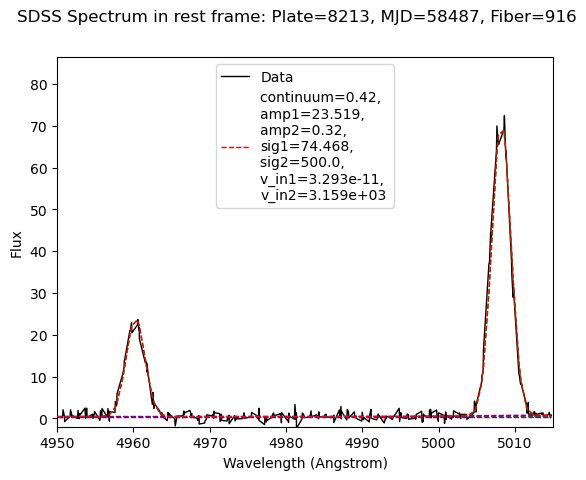

88
8221-58198-384


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


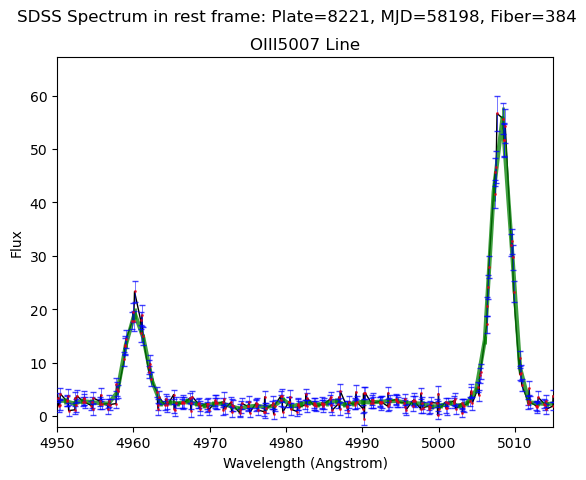

5677 5918
[2.22366743e+00 1.80473454e+01 2.25963229e-03 7.35445647e+01
 5.13845010e+02 1.35246741e-02 7.11841650e+05]


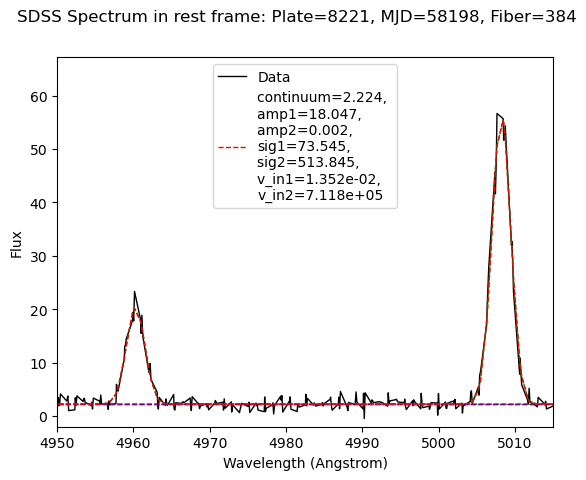

89
8236-58197-846


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


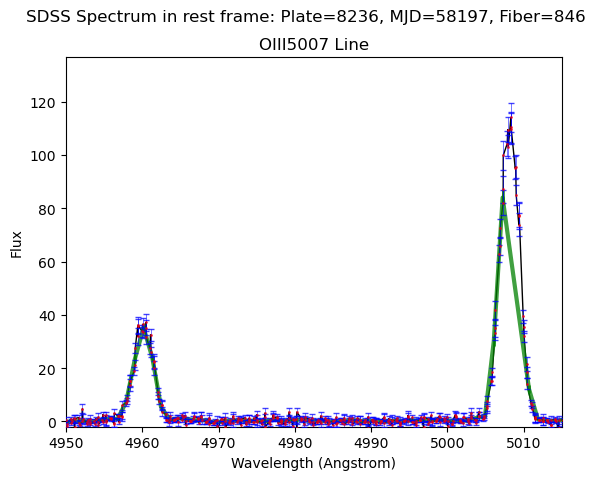

9666 10041
[1.56231875e-01 3.75952547e+01 6.14210401e-01 7.16381815e+01
 9.39421199e+02 1.12909994e-18 1.10230199e+04]


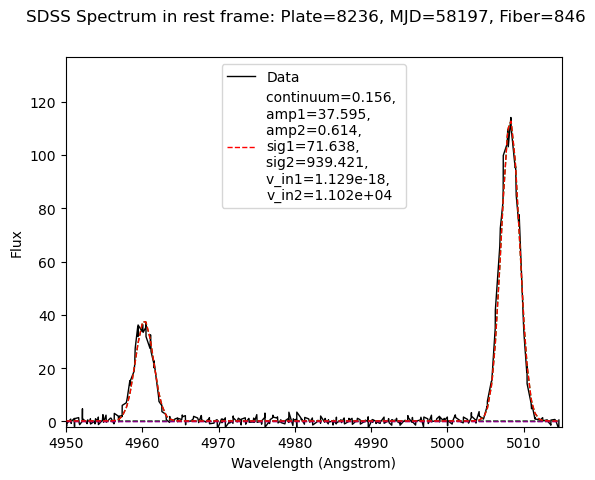

90
8236-58500-846


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


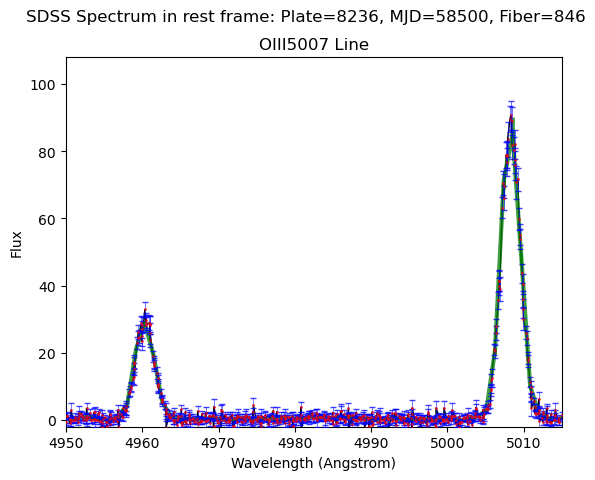

14533 15091
[2.91865454e-01 2.93724955e+01 1.00122223e-01 7.32195423e+01
 8.27997628e+02 2.82807884e+00 1.07938807e+04]


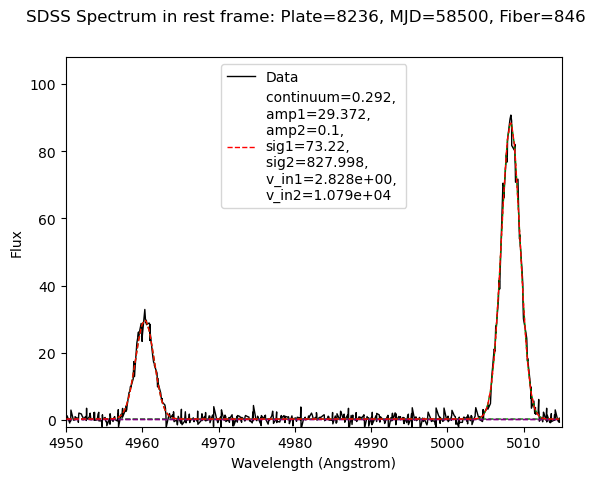

91
8396-57837-524


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


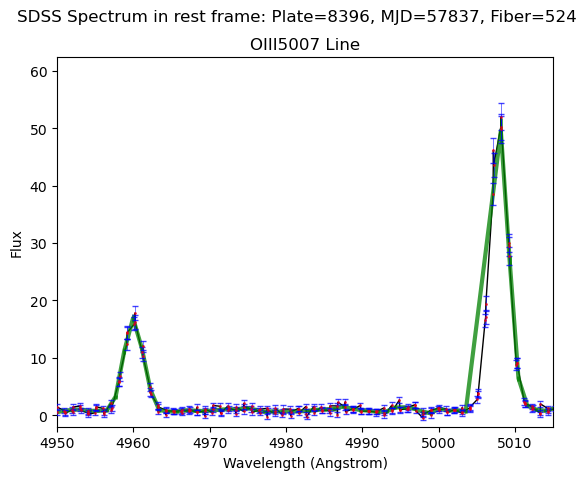

4996 5186
[7.79447312e-01 1.60194891e+01 1.65595429e-01 7.17870247e+01
 5.16856797e+02 1.46191135e-33 2.19933120e+03]


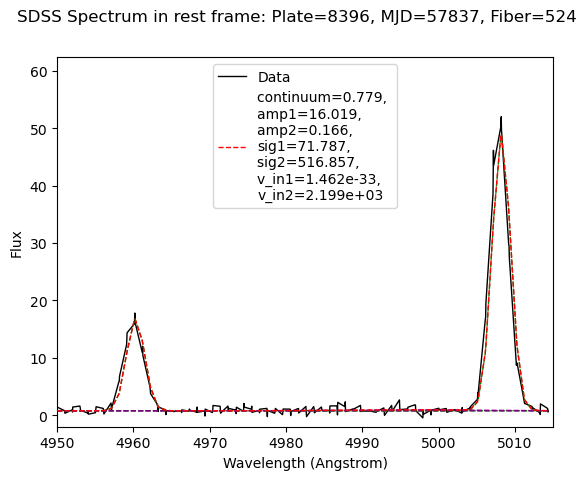

92
8845-58159-68


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


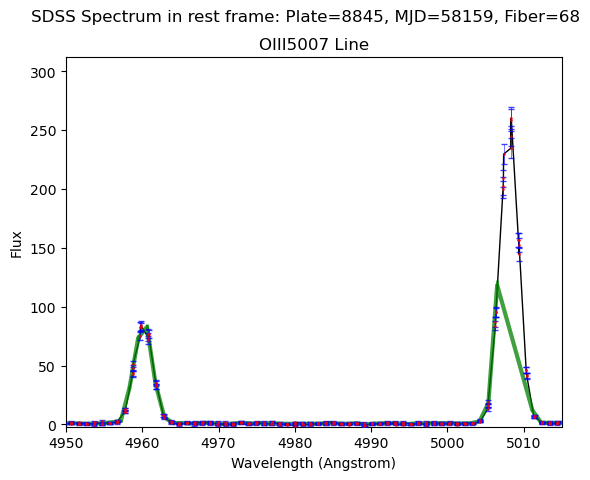

7055 7311
[6.14285397e-01 8.49137355e+01 1.67450586e-01 7.09604945e+01
 5.00000001e+02 1.47018699e-12 1.24252265e-06]


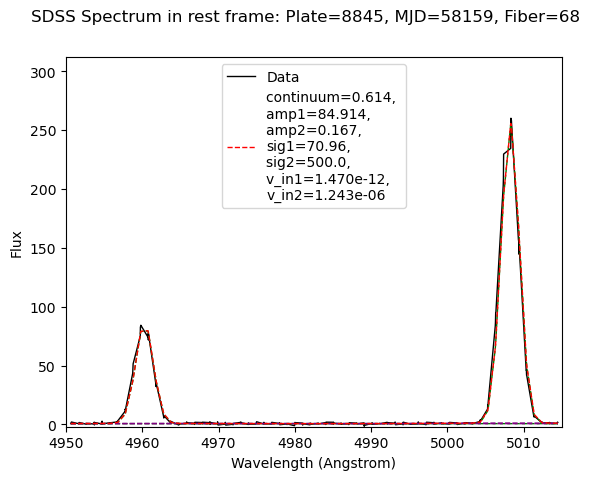

93
10261-58462-346


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


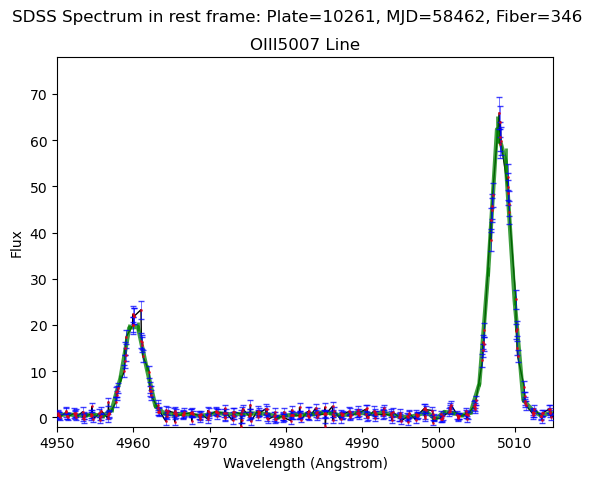

6880 7180
[5.12214132e-01 2.08725390e+01 5.00000000e+00 7.88651782e+01
 5.00000000e+02 4.82650796e-26 4.62742629e+03]


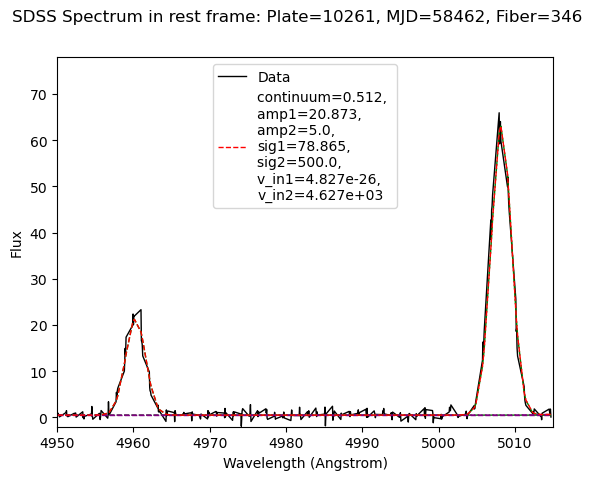

94
10664-58464-982


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


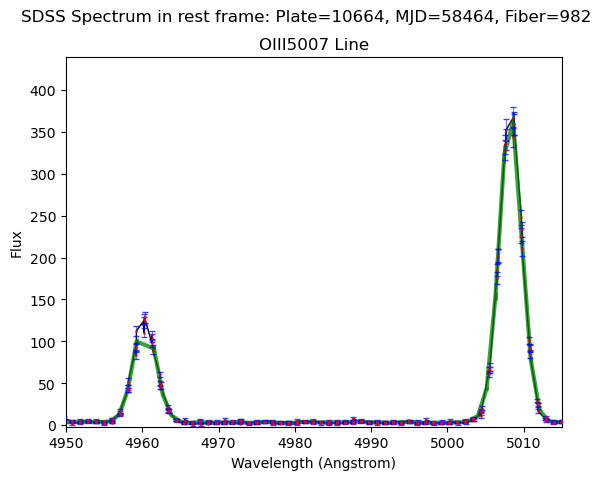

6132 6379
[3.14161838e+00 1.21638156e+02 6.40062037e-02 8.88518359e+01
 5.00000000e+02 2.63452995e+00 1.04165824e-07]


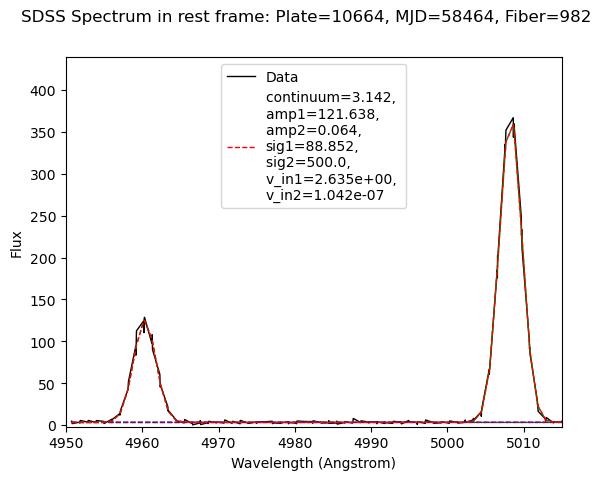

95
10724-58391-490


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


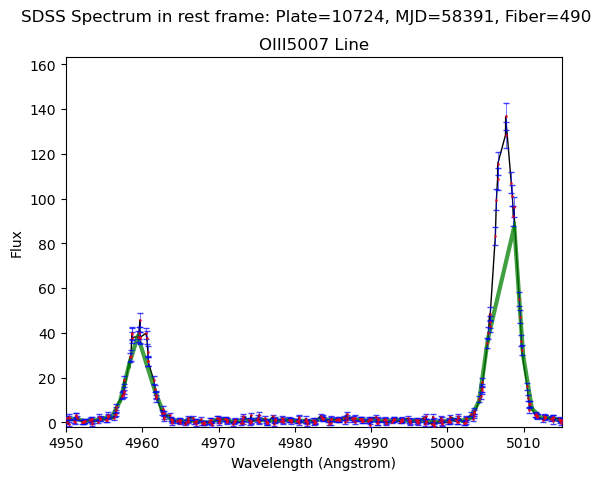

7974 8283
[7.61219980e-01 3.41995406e+01 7.55352629e-01 7.65749606e+01
 5.00000000e+02 1.57294066e-34 2.71592943e+03]


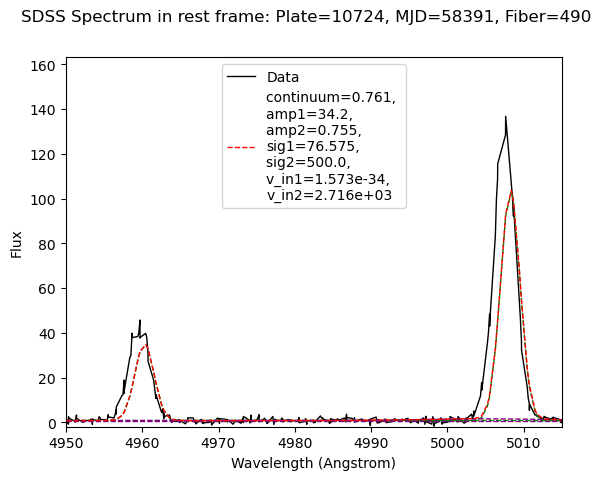

96
10742-58198-786


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


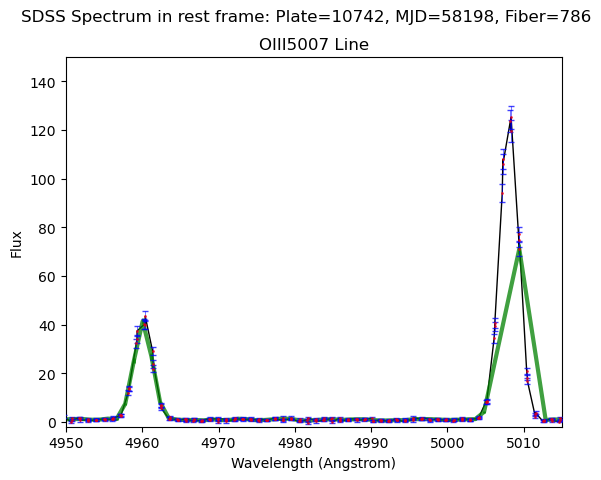

4448 4631
[8.65748845e-01 4.16141939e+01 1.29259325e-03 7.17882681e+01
 1.07272931e+03 4.32026166e-08 1.38511508e+04]


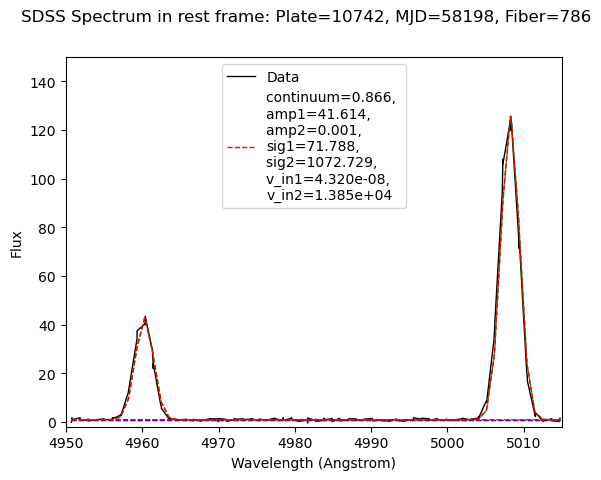

97
10756-58226-977


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


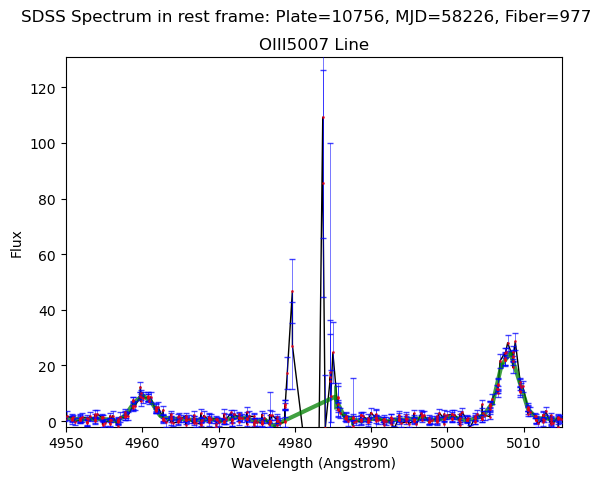

10915 11281
[6.54952594e-01 8.14636541e+00 1.20290527e+00 7.48839134e+01
 8.90191260e+02 1.21615347e-01 3.47252419e+05]


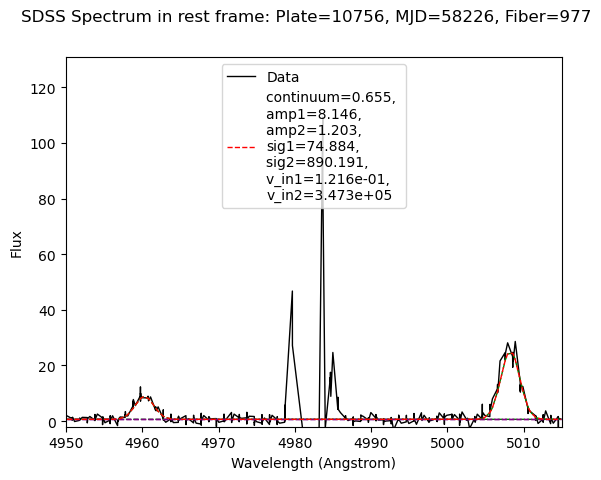

98
10911-58256-936


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


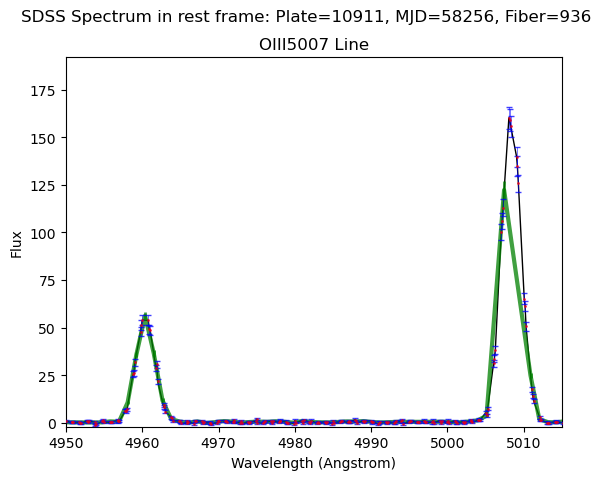

5323 5515
[2.68631328e-10 5.48729015e+01 1.47820744e-01 7.48168993e+01
 2.19385487e+03 8.28139740e+00 8.08573701e-06]


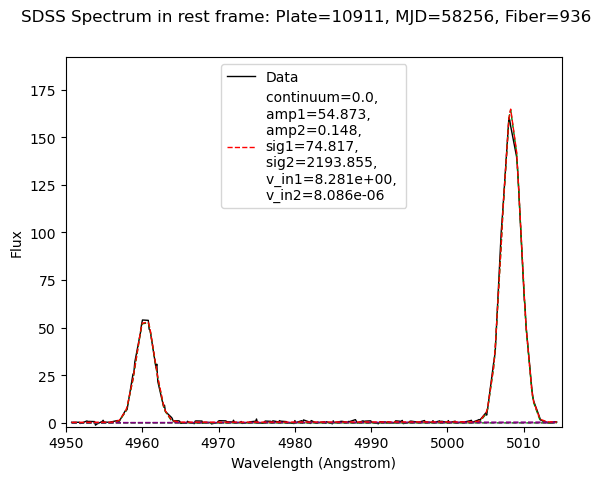

99
11112-58428-906


C:\Users\nihad\AppData\Local\Temp\ipykernel_29092\170207611.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


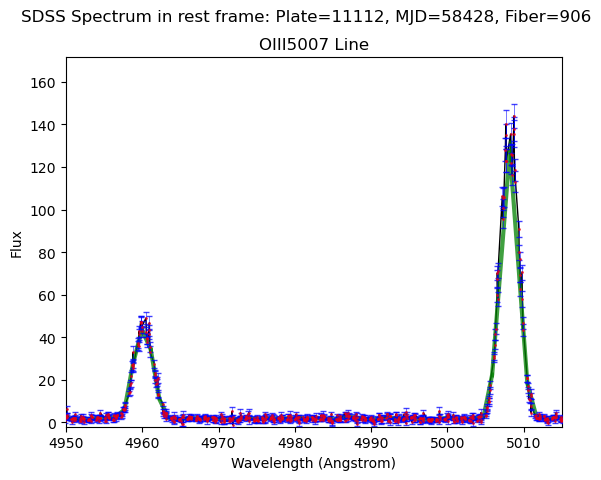

13760 14358
[1.72192977e+00 4.52549483e+01 1.17647303e-01 7.03069915e+01
 1.31105247e+03 1.41648644e-05 4.68151081e+04]


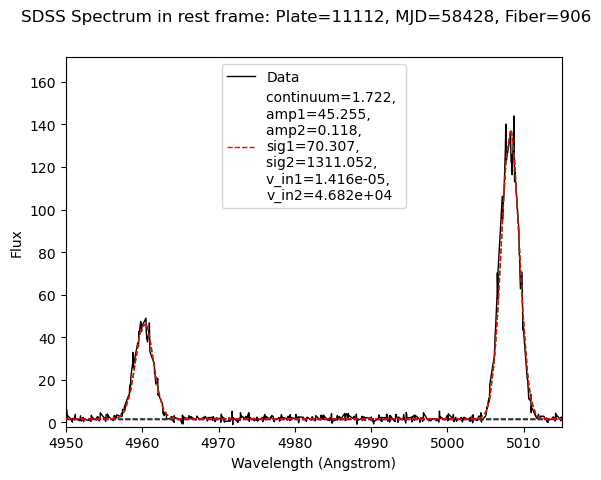

In [122]:
for i in range(100):
    print(i)
    num = random_galaxies[i]
    gal = cut_gals[num]

    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    print(str(gal["PLATE"]) + "-" + str(gal["MJD"])+ "-"+ str(gal["FIBER"]))
    sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber)
    if sp:
        spec_hdu = sp[0]
        spec_data = spec_hdu[1].data
    
        z = spec_hdu[2].data["z"]
    
        header = spec_hdu[0].header
    
        loglam = spec_data['loglam'].copy()
        flux = spec_data['flux'].copy()
        wavelength = 10**loglam/(1+z)
        ivar = spec_data['ivar'].copy()
        uncertainty = 1/np.sqrt(ivar)
    
        ivar0 = np.where(ivar == 0)[0]
        clipped = [item for item in ivar0 if ((item > min and item < max))]

        max_y = []
        flux_sum =[]
        wave_sum = []
        ivar_sum = []
        filter = []
        nexp = header['NEXP']
        for sub_exp in range(nexp//2):
            sub_data = spec_hdu[4+sub_exp].data
            sub_flux = sub_data['flux']
            sub_wavelength = 10**sub_data['loglam'] / (1+z)
            sub_ivar = sub_data['ivar'] 
            if (len(sub_ivar) != len(sub_wavelength) and len(sub_ivar) != len(sub_flux)):
                print("COOKIE"+str(len(sub_ivar)), str(len(sub_wavelength)), str(len(sub_flux)))
            flux_sum.extend(sub_flux[sub_ivar>0])
            wave_sum.extend(sub_wavelength[sub_ivar>0])
            ivar_sum.extend(sub_ivar[sub_ivar>0])
            filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])
            uncert_sub = [y if (x == 0) else -5 for x,y in zip(sub_ivar,sub_flux)]
            min_sub = np.where(sub_wavelength > 4950)[0][0]
            max_sub = np.where(sub_wavelength > 5015)[0][0]
            max_y.append(sub_flux[min_sub:max_sub].max())

        combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
        # Unzip the sorted pairs back into separate lists
        sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 
        plt.plot(sorted_wave, sorted_flux, linewidth=1, color='black')
        plt.errorbar(wavelength, flux,yerr=uncertainty, lw=3, label="clipped", color='green',markersize=1, markeredgecolor="red", alpha=0.75, elinewidth=2)
        plt.errorbar(sorted_wave, sorted_flux, yerr=1/np.sqrt(sorted_ivar), fmt='o', color='blue',capsize=2, markersize=1, markeredgecolor="red", alpha=0.75, elinewidth=0.5, zorder=3)
        
        plt.xlabel("Wavelength (Angstrom)")
        plt.ylabel("Flux")
        plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
        plt.title("OIII5007 Line")
        plt.xlim(4950,5015)
        plt.ylim(-2, int(np.max(max_y))+int(np.max(max_y))/5)
        plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"average_oii.png")
        plt.show()

        min = np.where(np.array(sorted_wave) > 4950)[0][0]
        max = np.where(np.array(sorted_wave) > 5015)[0][0]
        print(min, max)

        inf = math.inf
        ranged_wave = sorted_wave[min:max]
        ranged_flux = sorted_flux[min:max]

        parameters, covariance = curve_fit(Gauss, ranged_wave, ranged_flux,sigma = 1/np.sqrt(sorted_ivar[min:max]),  method = "trf", p0=[2, 200, 2, 50, 1000, 50, 50], 
                                   bounds=([0,0,0,50,500,0,0],[10,inf,5,500, 5000,inf,inf]))
        print(parameters)
        A, B, C, D, E, F, G= parameters
        fit_y = Gauss(ranged_wave, A, B, C, D, E, F, G)

        #Plots the gaussian with the fits
        fig, ax = plt.subplots()
        plt.plot(ranged_wave, ranged_flux, '-',color = 'black',linewidth=1, label='Data')
        plt.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1, label=f"continuum={round(A,3)}, \namp1={round(B,3)}, \namp2={round(C,3)}, \nsig1={round(D,3)},\nsig2={round(E,3)}, \nv_in1={F:.3e}, \nv_in2={G:.3e}", zorder=3)
        plt.plot(ranged_wave, o_iii_1(ranged_wave, B, D, F)+A, '--',color = 'green',linewidth=1)
        plt.plot(ranged_wave, o_iii_2(ranged_wave, B, D, F)+A, '--',color = 'green',linewidth=1)
        plt.plot(ranged_wave, broad_1(ranged_wave, C, E, G)+A, '--',color = 'purple',linewidth=1)
        plt.plot(ranged_wave, broad_2(ranged_wave, C, E, G)+A, '--',color = 'purple',linewidth=1)
        plt.legend(loc='upper center')

        plt.xlabel("Wavelength (Angstrom)")
        plt.ylabel("Flux")
        plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
        plt.xlim(4950,5015)
        plt.ylim(-2, int(np.max(max_y))+int(np.max(max_y))/5)
        plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_oii.png")
        plt.show()


        

In [130]:
def merge_images(file1, file2):
    """Merge two images into one, displayed side by side
    :param file1: path to first image file
    :param file2: path to second image file
    :return: the merged Image object
    """
    image1 = Image.open(file1)
    image2 = Image.open(file2)
    (width1, height1) = image1.size
    (width2, height2) = image2.size

    result_height = height1 + height2
    result_width = width1

    result = Image.new('RGB', (result_width, result_height))
    result.paste(im=image1, box=(0, 0))
    result.paste(im=image2, box=(0, height1))
    return result

for i in range(100):
    num = random_galaxies[i]
    gal = cut_gals[num]

    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    im1 = str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"average_oii.png"
    im2 = str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_oii.png"
    merge = merge_images(im1, im2)
    merge.save(str(i)+".jpeg")

pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(100):
    pdf.add_page()
    pdf.image(str(i)+".jpeg",w=pdf.epw,h=pdf.eph)
pdf.output("Clipped_OIII_analysis_w_gaussian.pdf")

In [ ]:
#Tabulation of different problems with the data
#Figure out how to write it out as a fits file